Evaluating model LogisticRegression with feature selection...
Selected Features: Index(['District_Lakhisarai', 'District_Madhepura', 'CropEstablishment_CT', 'Variety_HD_2985', 'Variety_HI_1563', 'Variety_PBW_154', 'SowingSchedule_T4', 'SowingSchedule_T5', 'HerbicideName_Metribuzin', 'HerbicideName_TOTAL'], dtype='object')
Evaluating model SVC without feature selection...
Evaluating model DecisionTreeClassifier without feature selection...
Evaluating model RandomForestClassifier without feature selection...
Evaluating model GradientBoostingClassifier without feature selection...
Evaluating model AdaBoostClassifier without feature selection...
Evaluating model GaussianNB without feature selection...
Evaluating model KNeighborsClassifier without feature selection...
Evaluating model Perceptron without feature selection...
Evaluating model RidgeClassifier without feature selection...
Model Evaluation Results:
                        Model       AUC  Accuracy (CA)  F1-score  Precision    Re

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Evaluating model GradientBoostingClassifier for SoilType_Low = 1...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Evaluating model AdaBoostClassifier for SoilType_Low = 1...
Evaluating model GaussianNB for SoilType_Low = 1...
Evaluating model KNeighborsClassifier for SoilType_Low = 1...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Evaluating model Perceptron for SoilType_Low = 1...
Evaluating model RidgeClassifier for SoilType_Low = 1...
Evaluating for SoilType_Medium: 0
Evaluating model LogisticRegression for SoilType_Medium = 0...
Evaluating model SVC for SoilType_Medium = 0...
Evaluating model DecisionTreeClassifier for SoilType_Medium = 0...
Evaluating model RandomForestClassifier for SoilType_Medium = 0...
Evaluating model GradientBoostingClassifier for SoilType_Medium = 0...
Evaluating model AdaBoostClassifier for SoilType_Medium = 0...
Evaluating model GaussianNB for SoilType_Medium = 0...
Evaluating model KNeighborsClassifier for SoilType_Medium = 0...
Evaluating model Perceptron for SoilType_Medium = 0...
Evaluating model RidgeClassifier for SoilType_Medium = 0...
Evaluating for SoilType_Medium: 1
Evaluating model LogisticRegression for SoilType_Medium = 1...
Evaluating model SVC for SoilType_Medium = 1...
Evaluating model DecisionTreeClassifier for SoilType_Medium = 1...
Evaluating model RandomForestCl

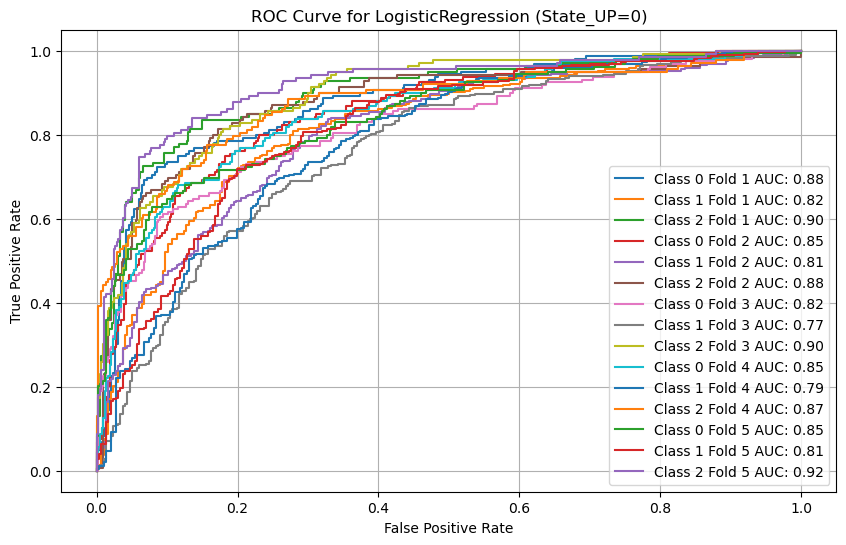

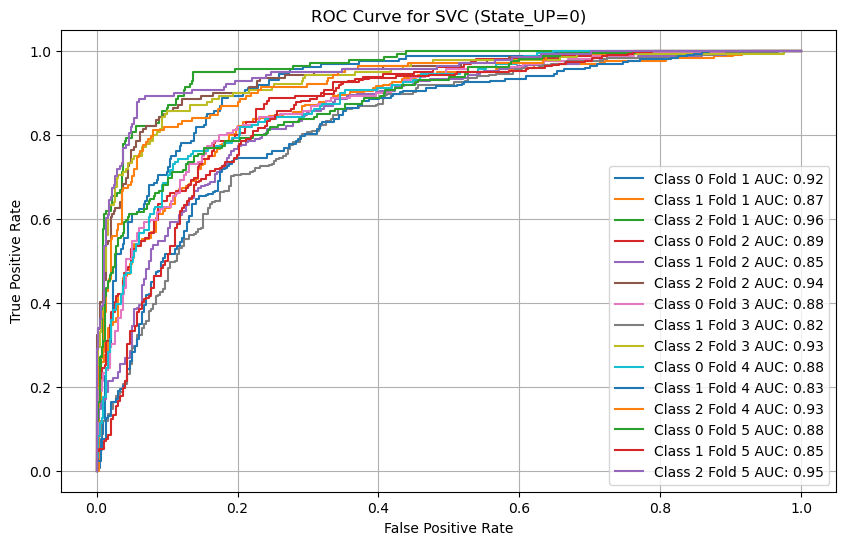

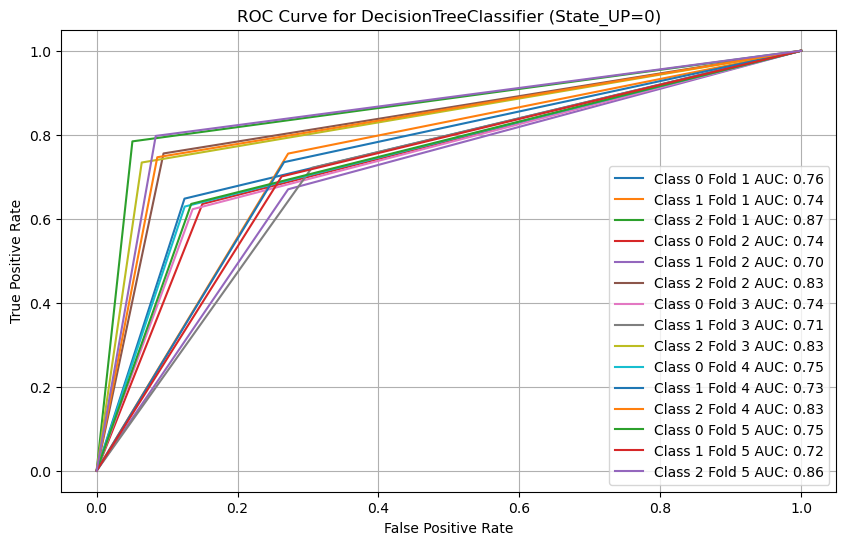

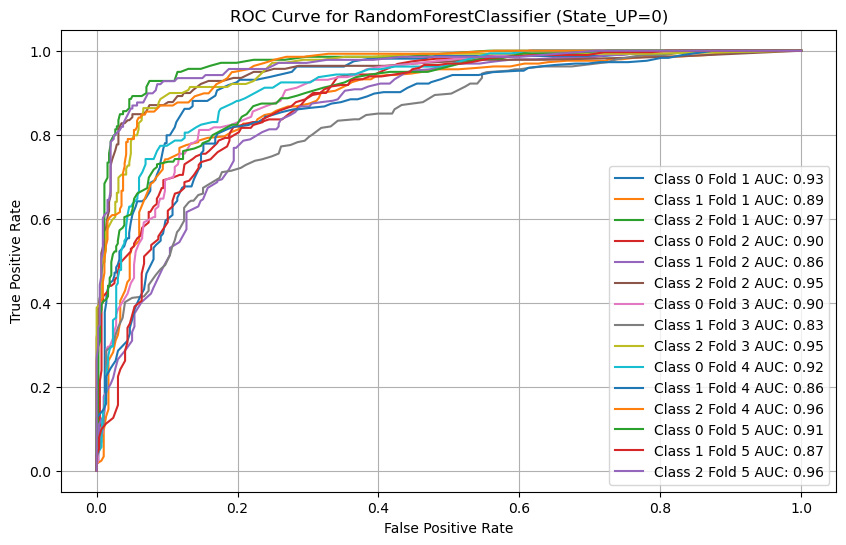

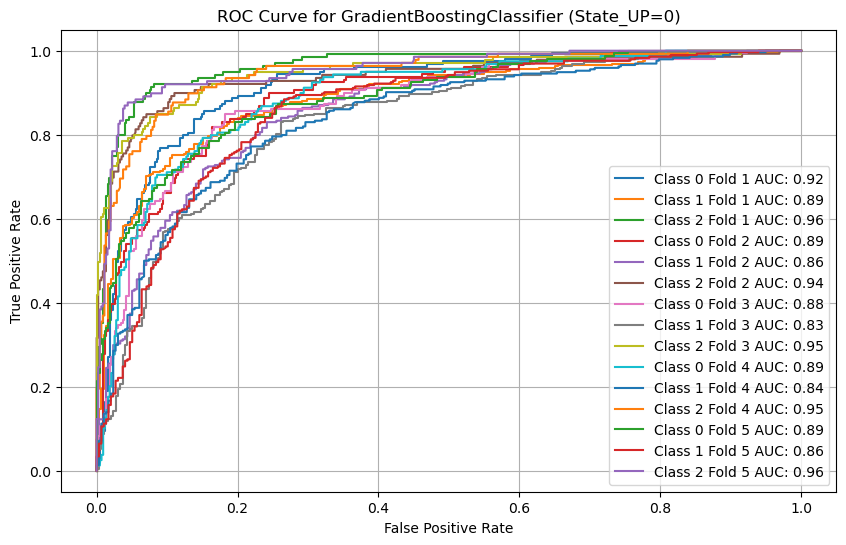

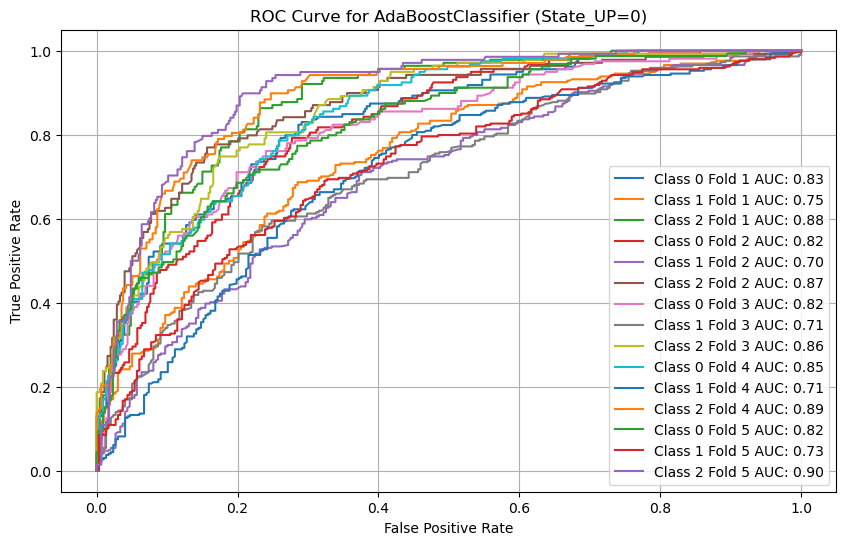

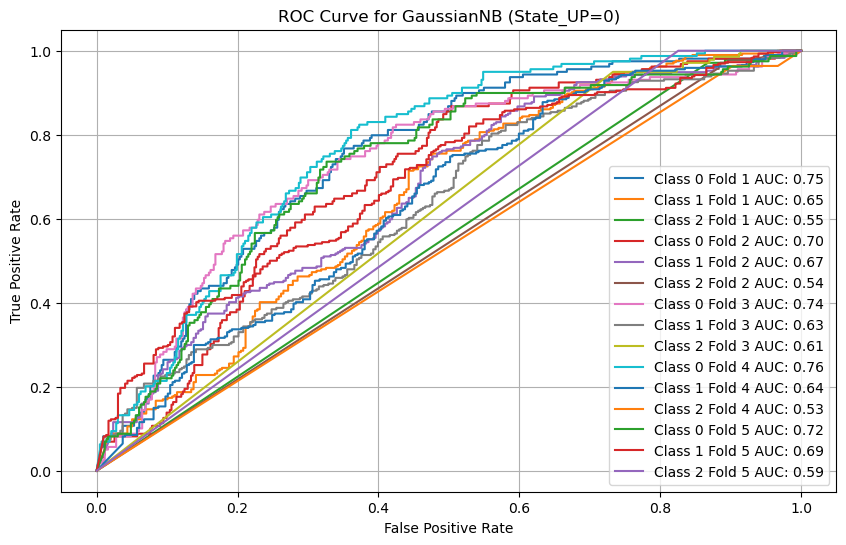

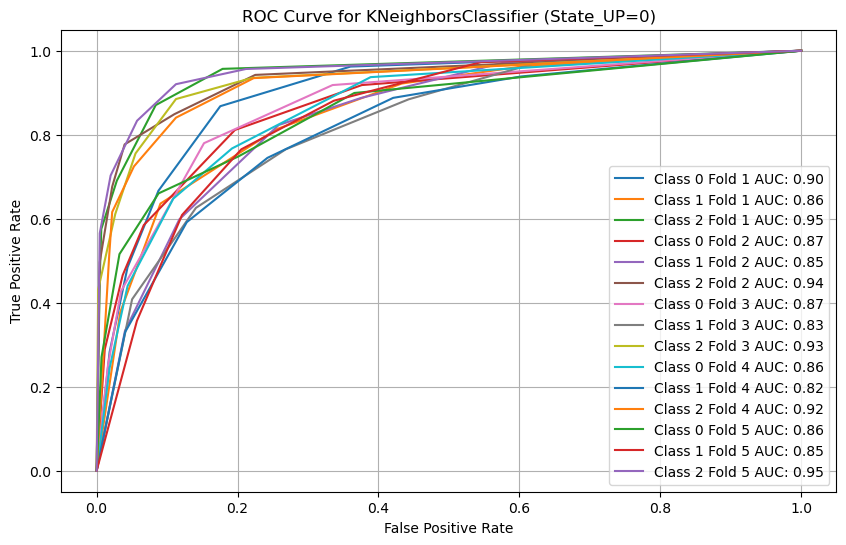

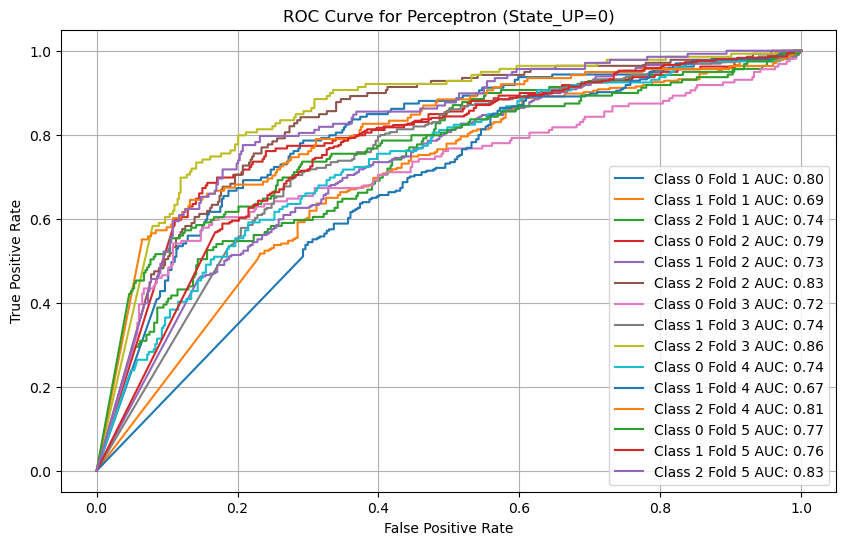

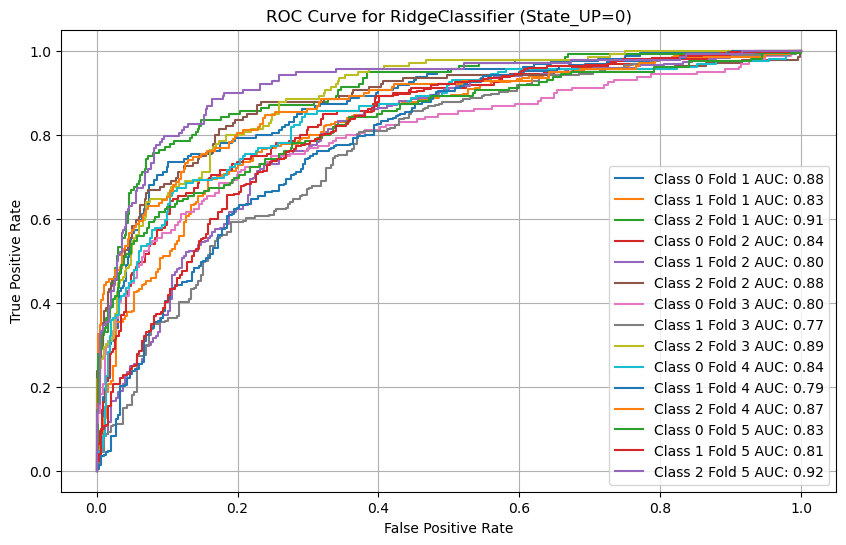


ROC Drawing for State_UP = 1...


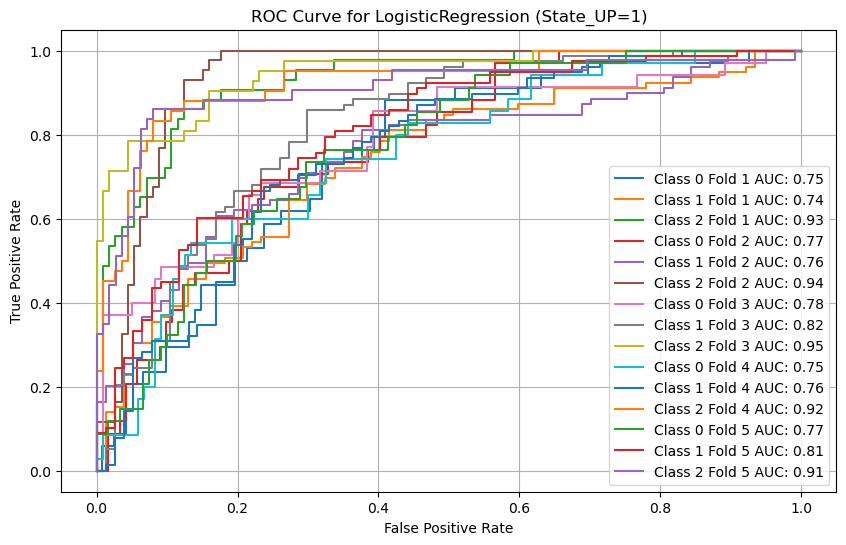

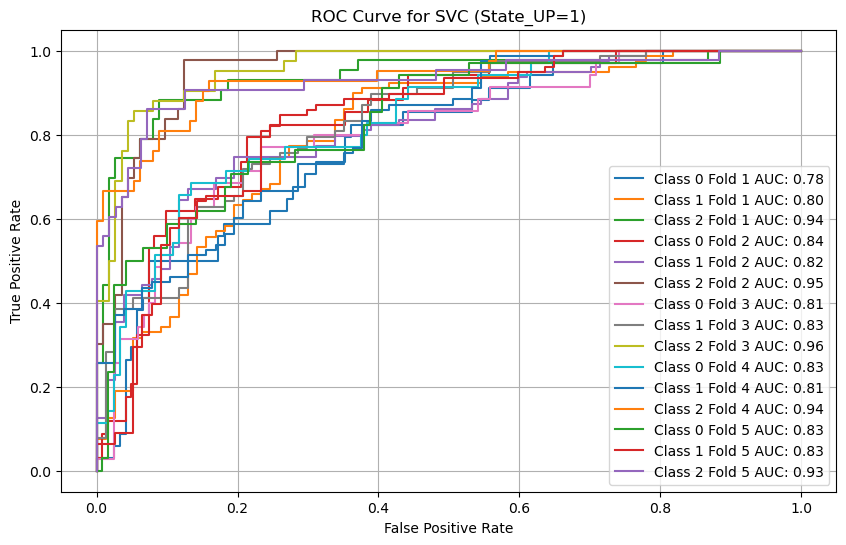

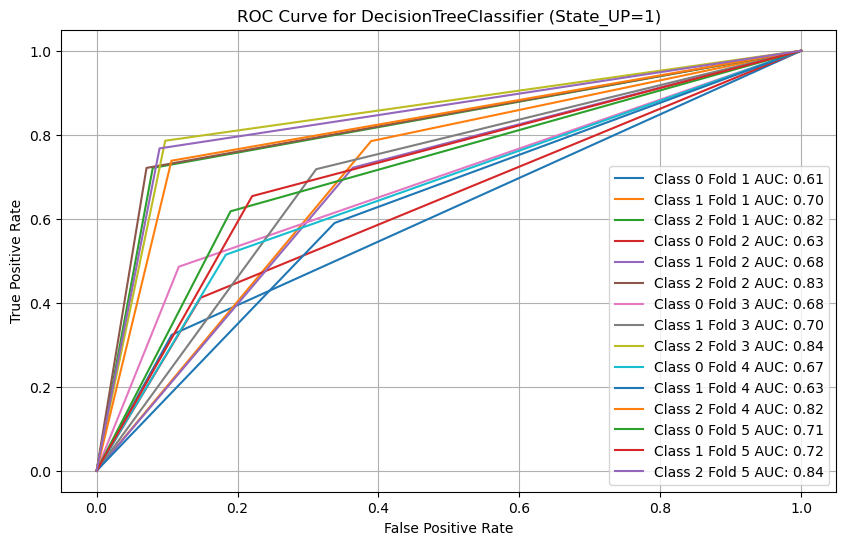

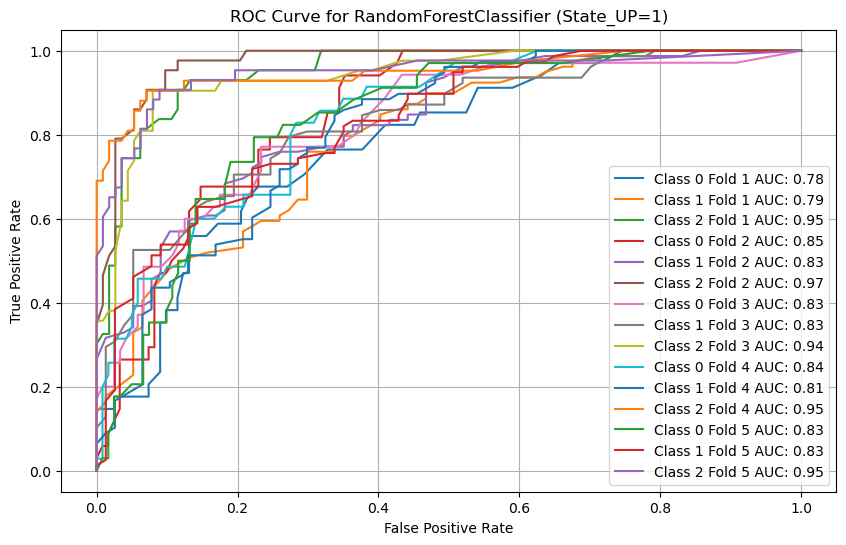

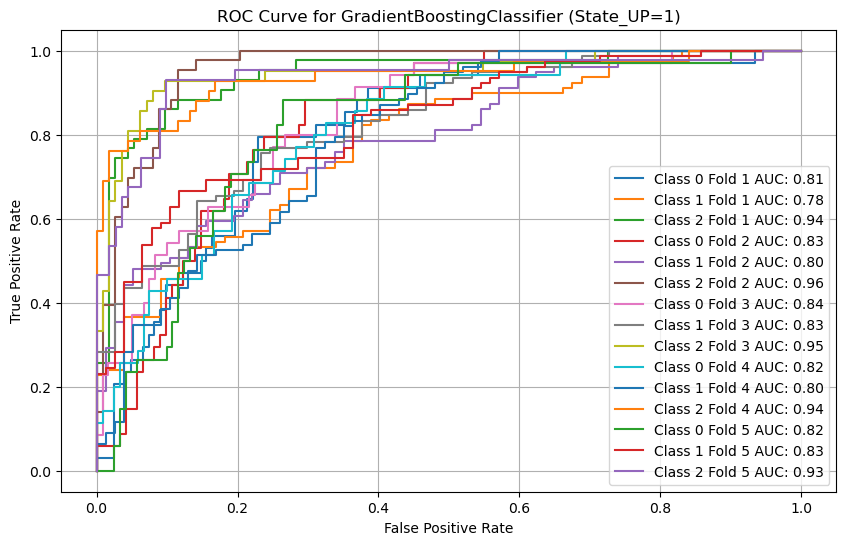

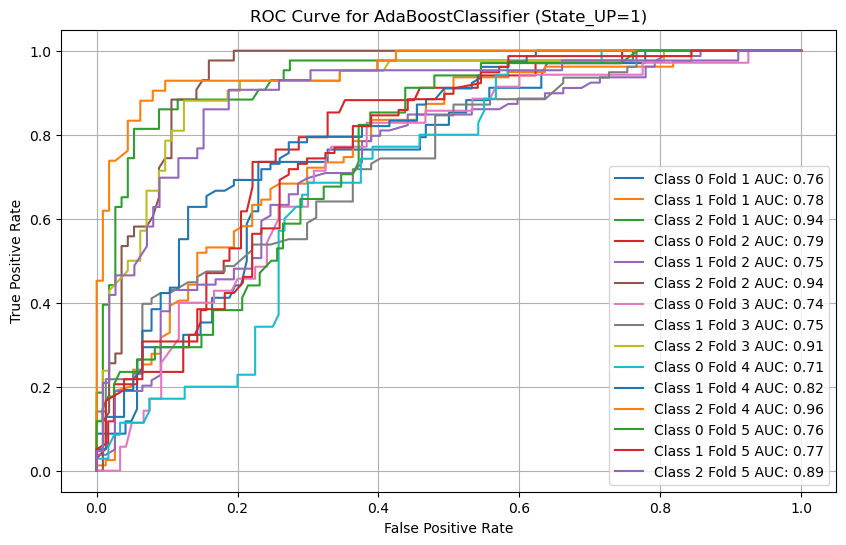

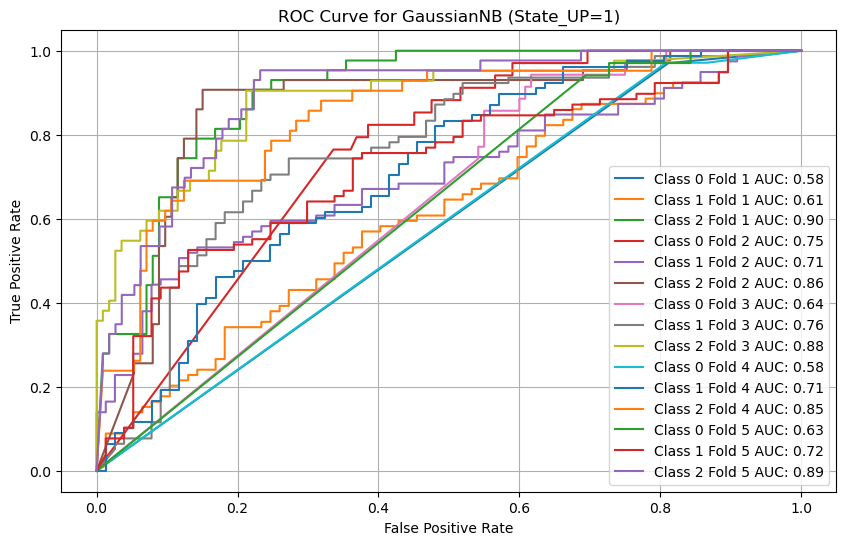

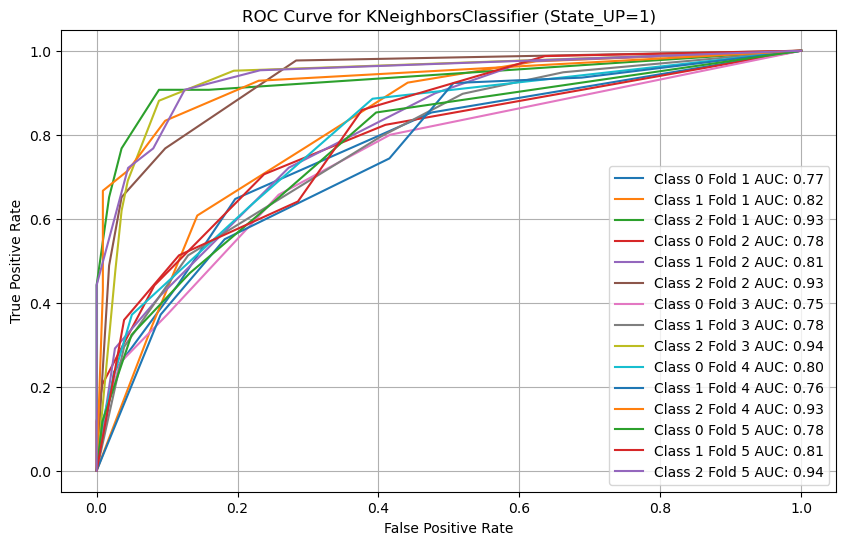

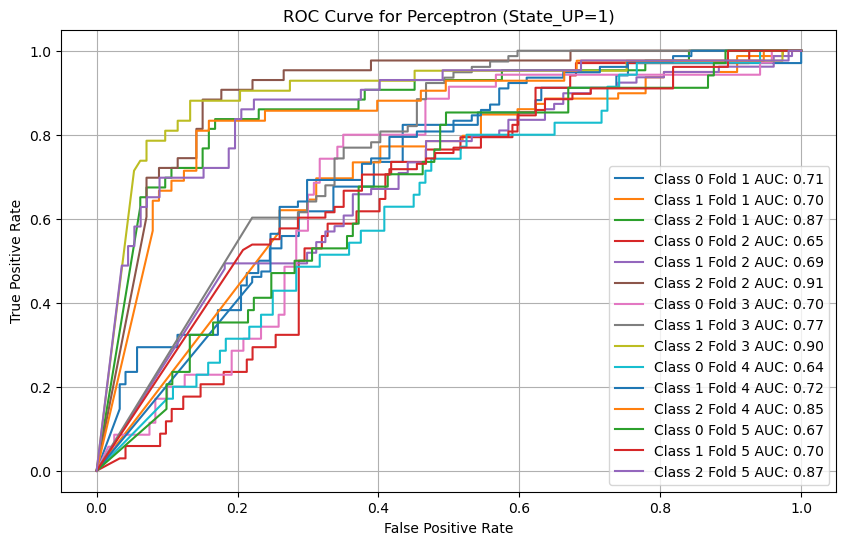

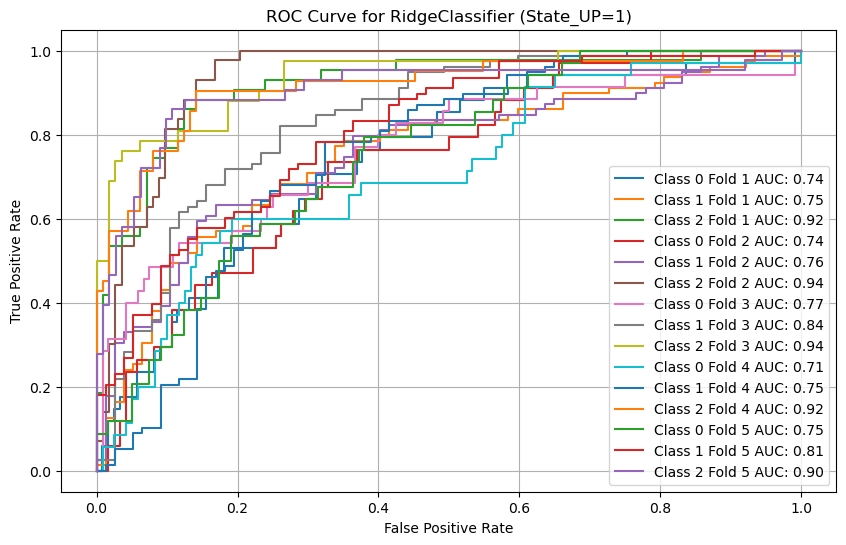


ROC Drawing for State_Bihar = 0...


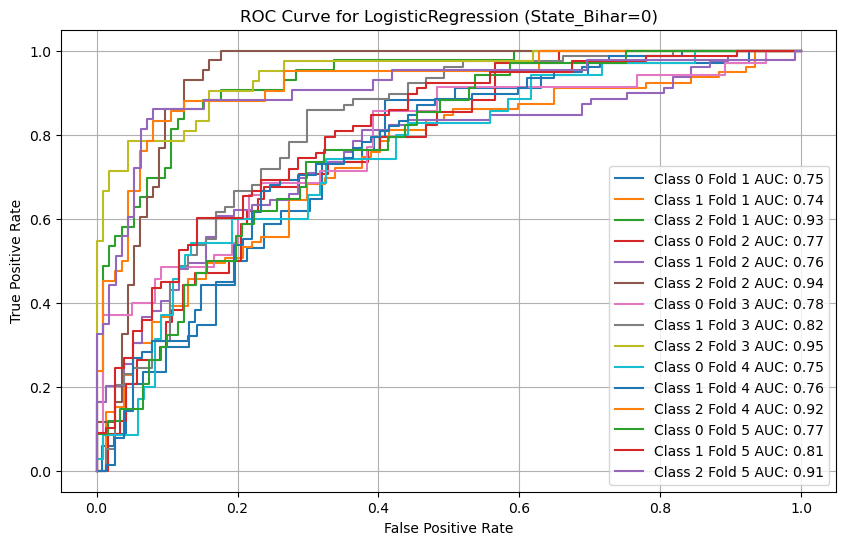

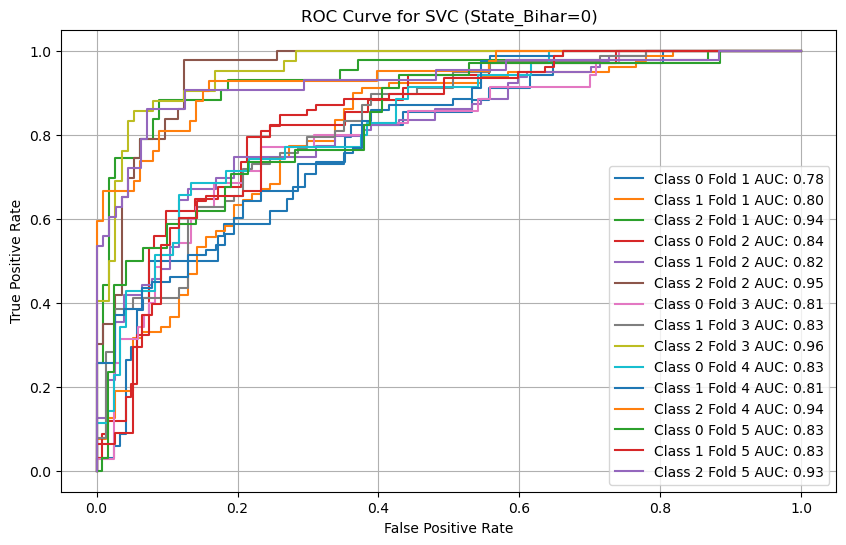

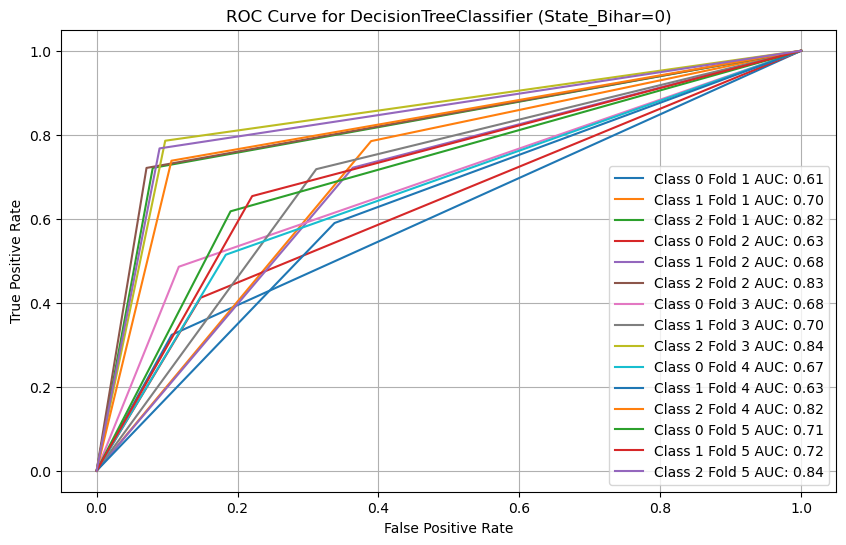

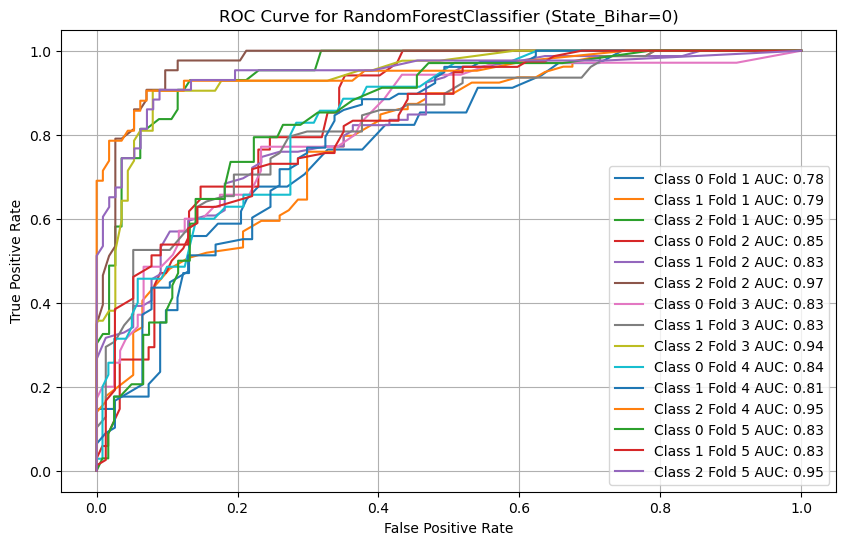

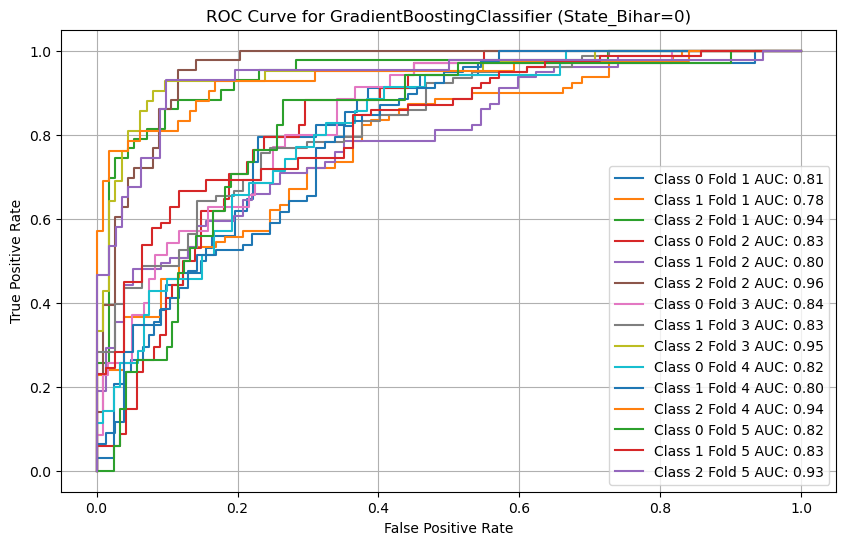

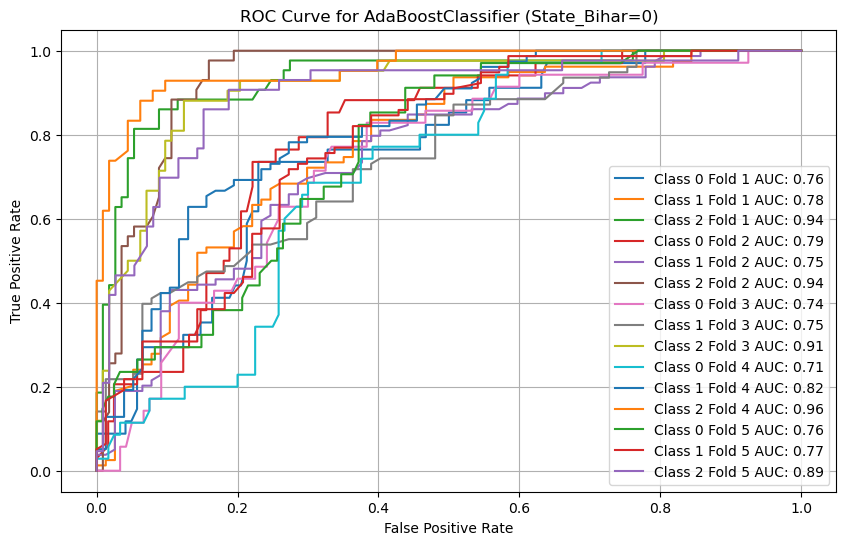

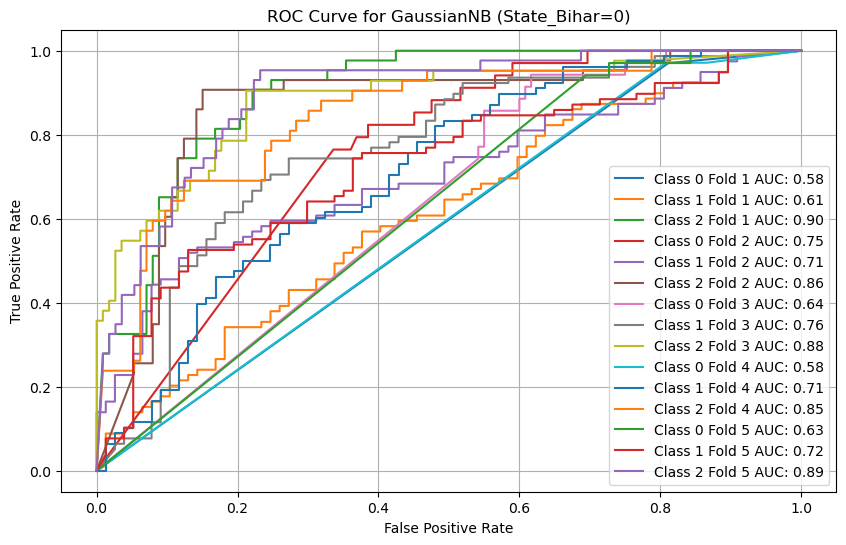

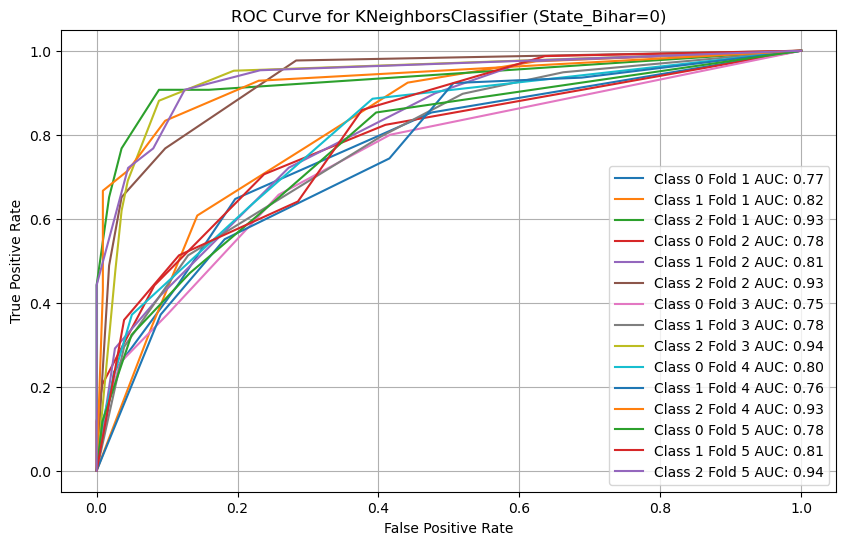

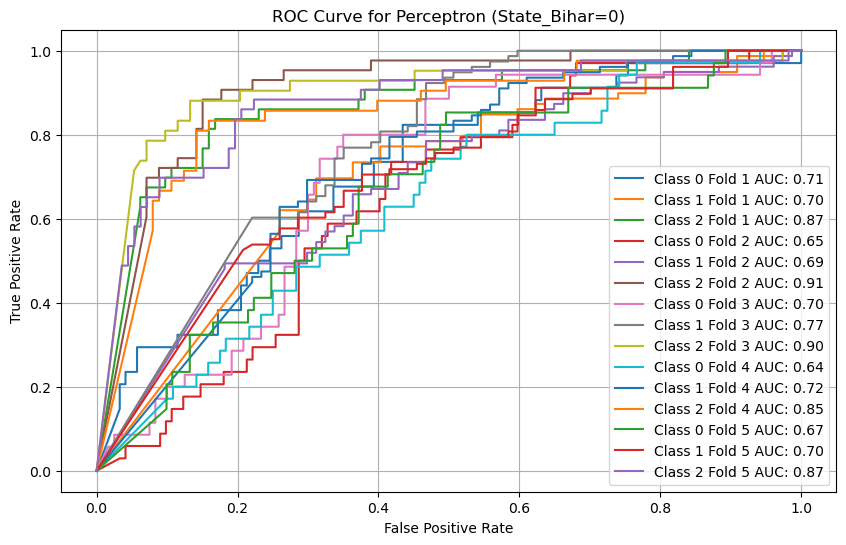

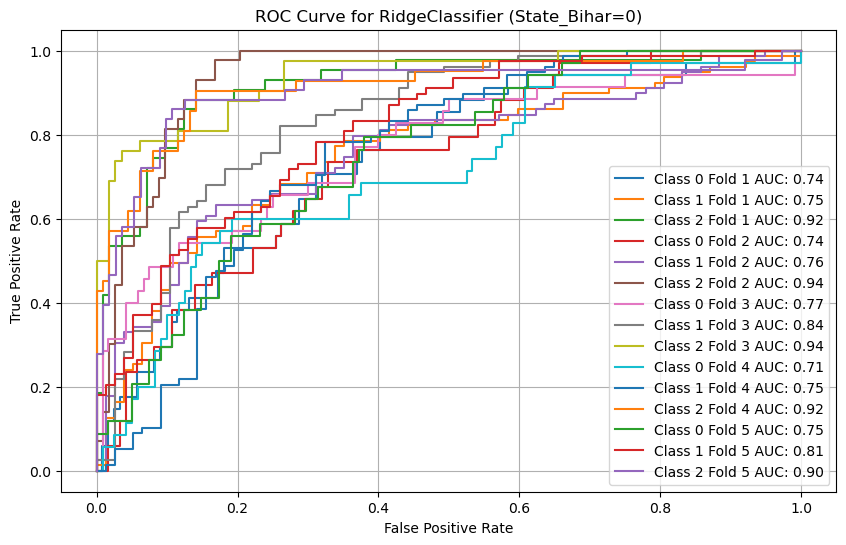


ROC Drawing for State_Bihar = 1...


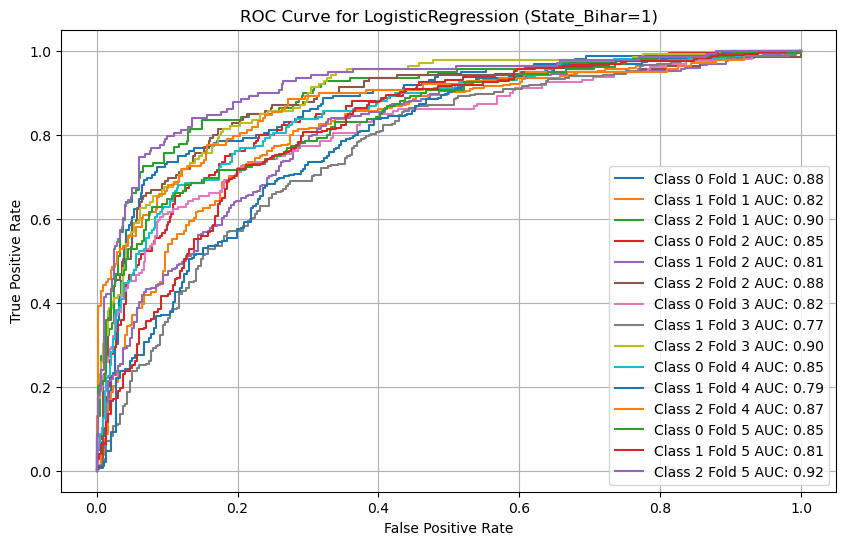

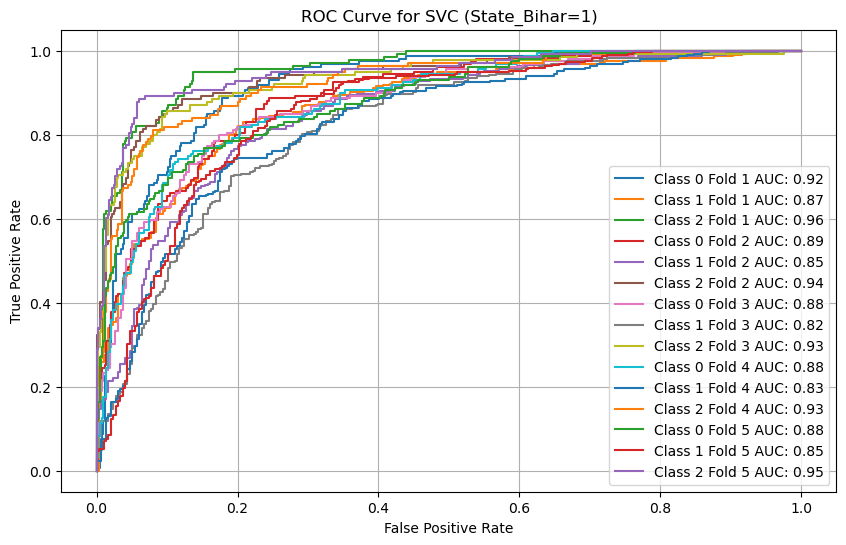

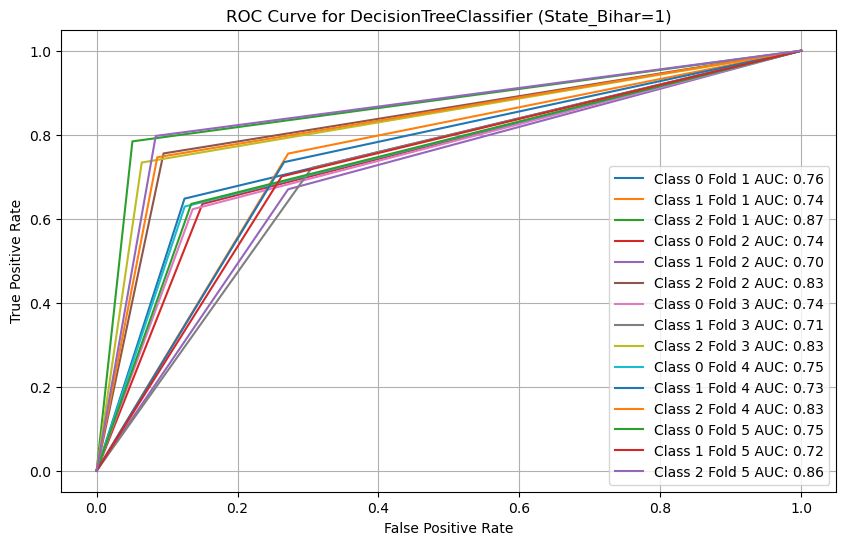

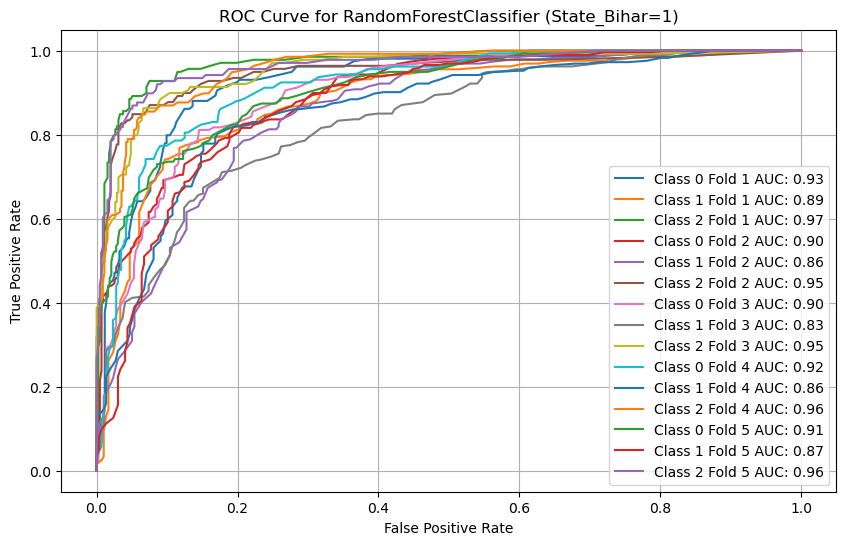

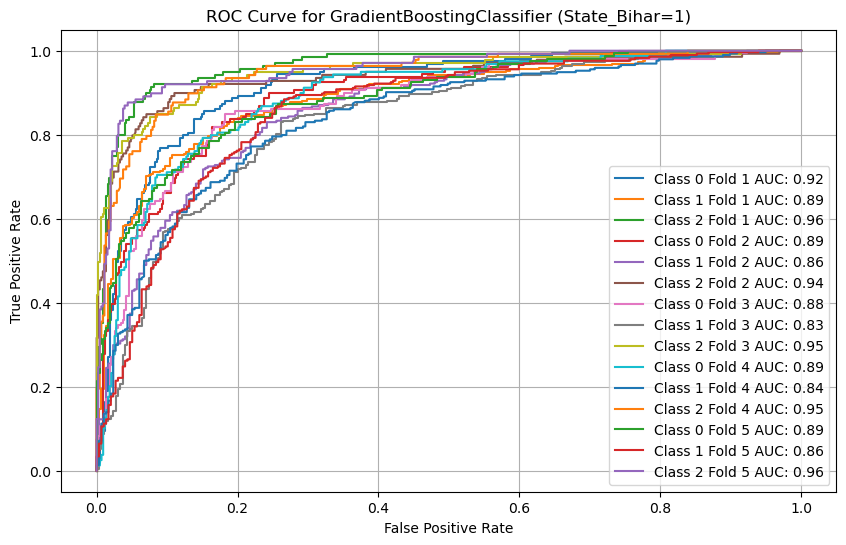

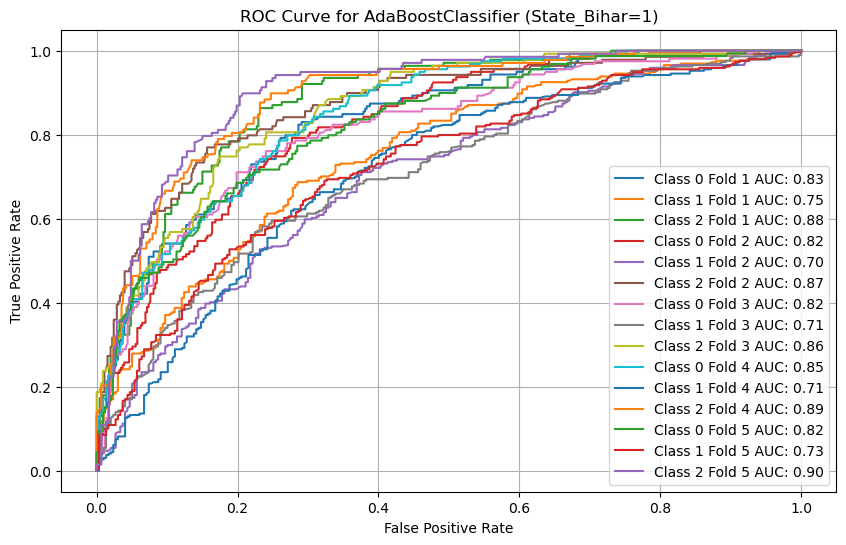

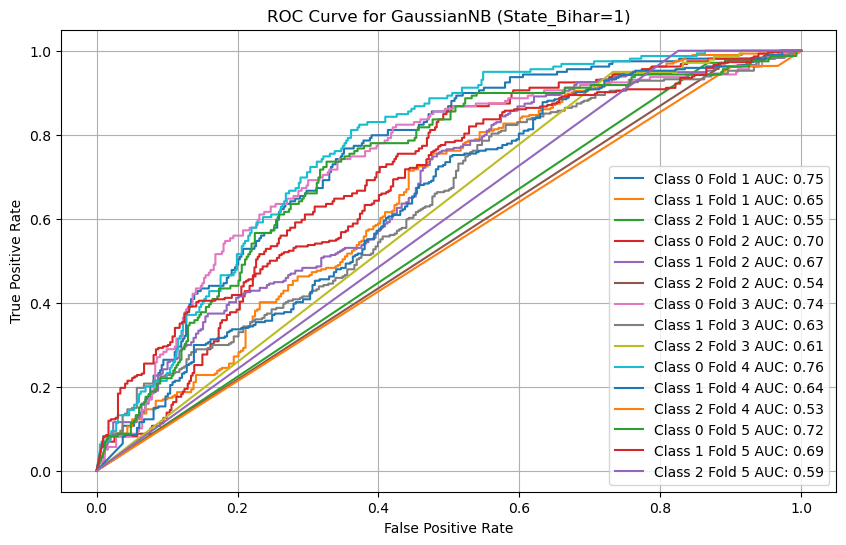

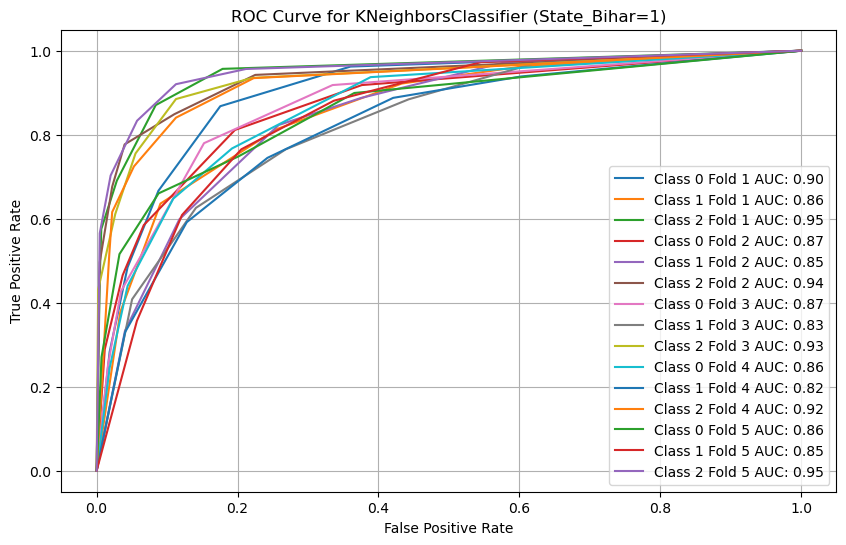

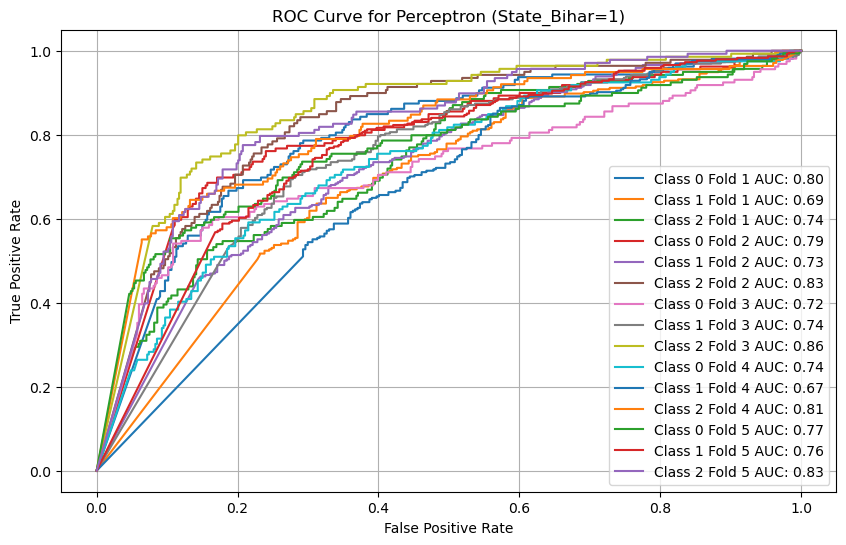

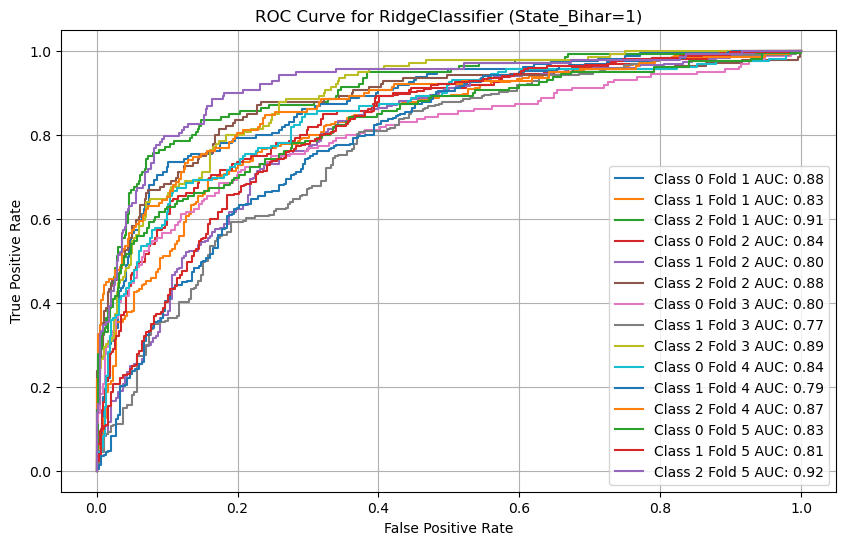


ROC Drawing for SoilType_Heavy = 0...


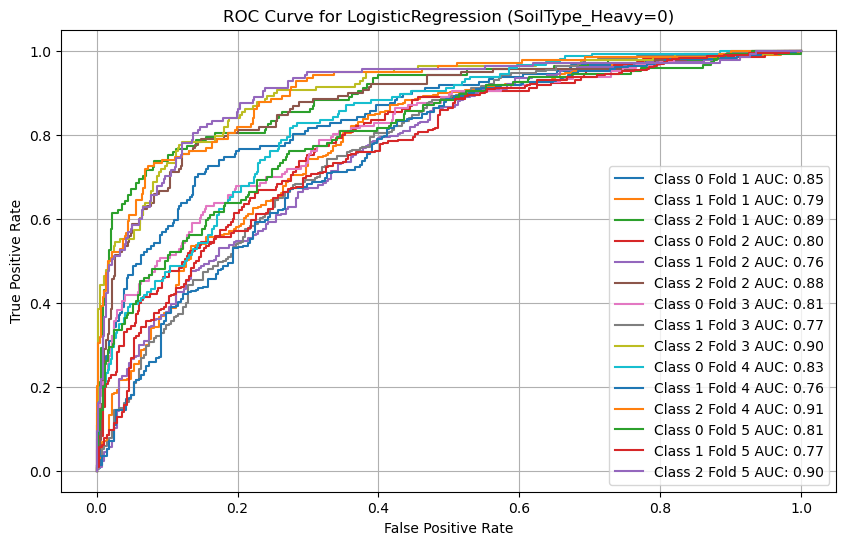

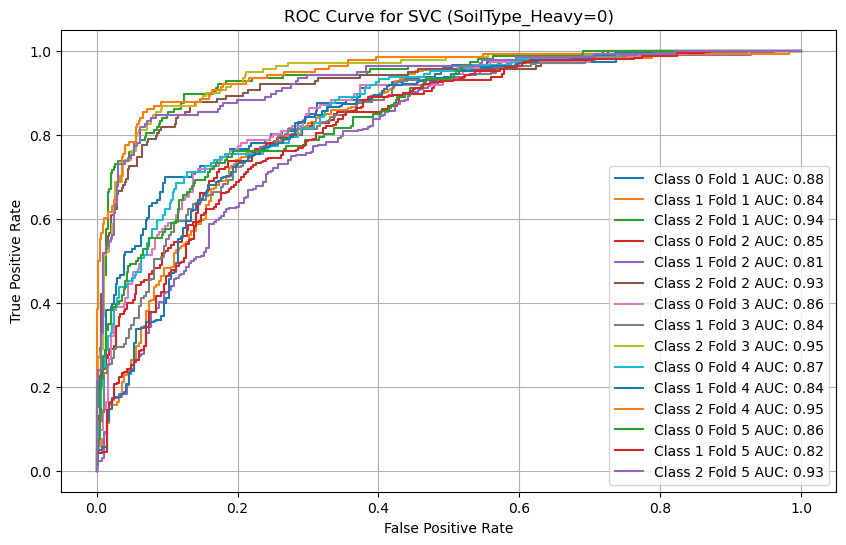

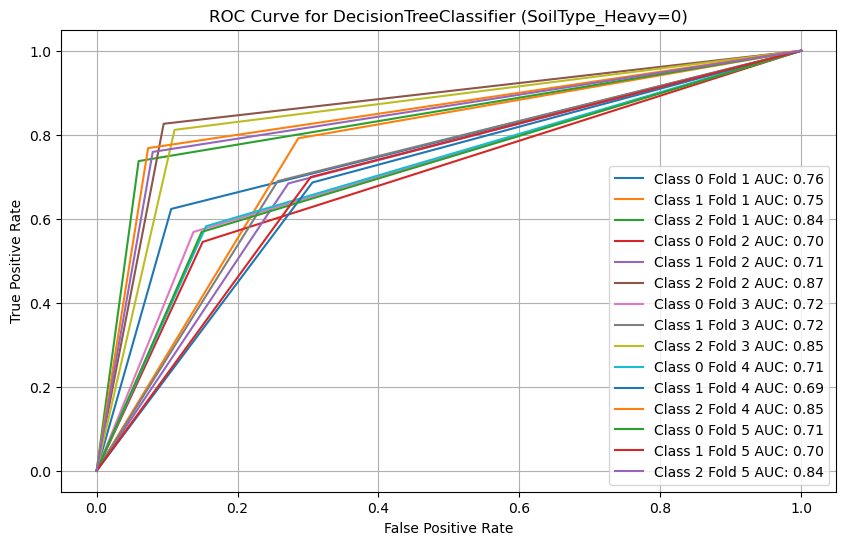

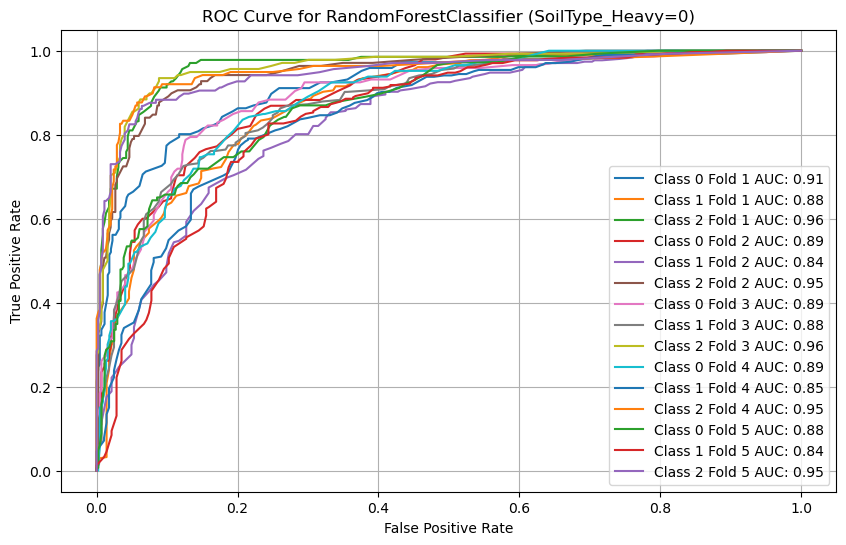

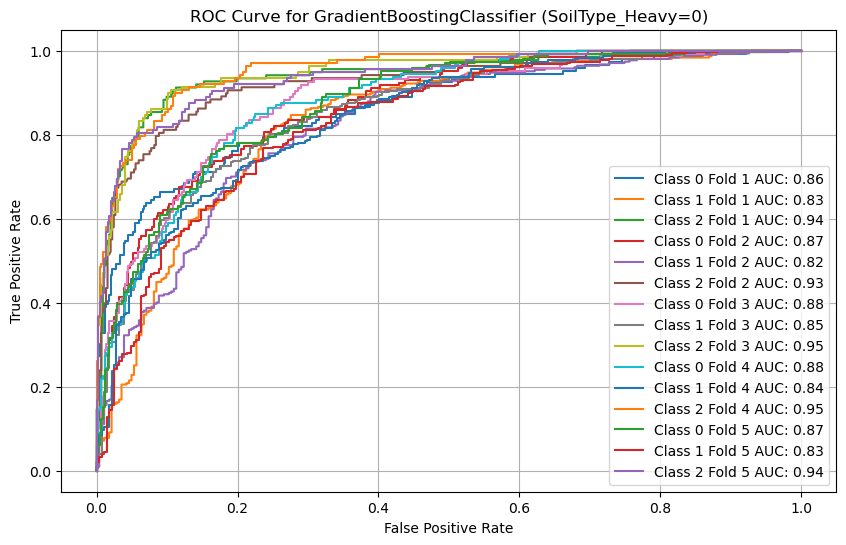

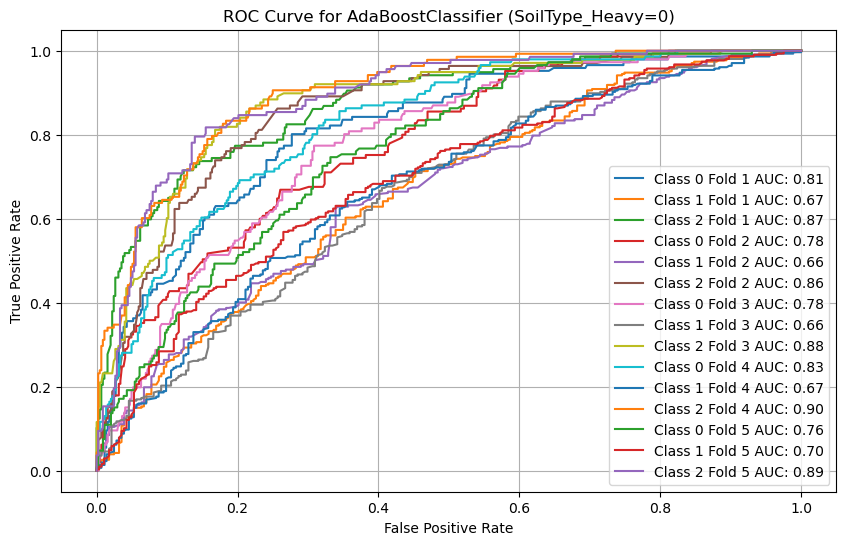

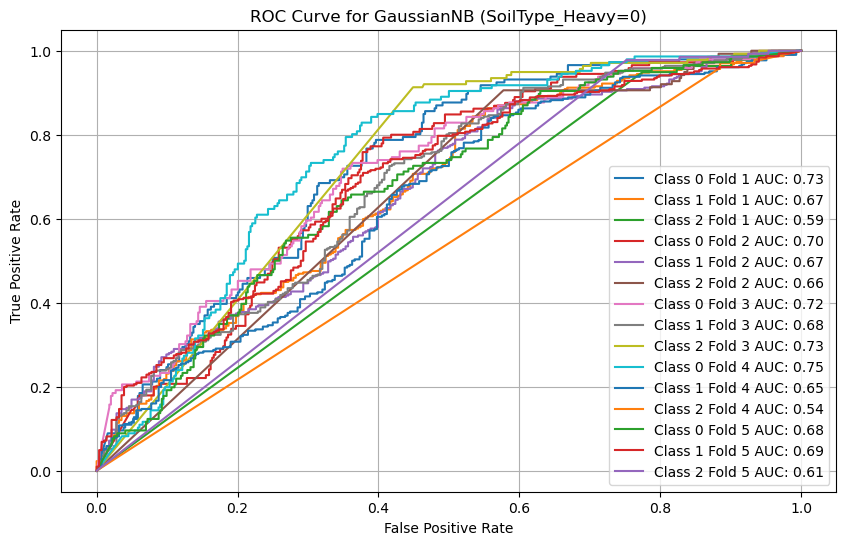

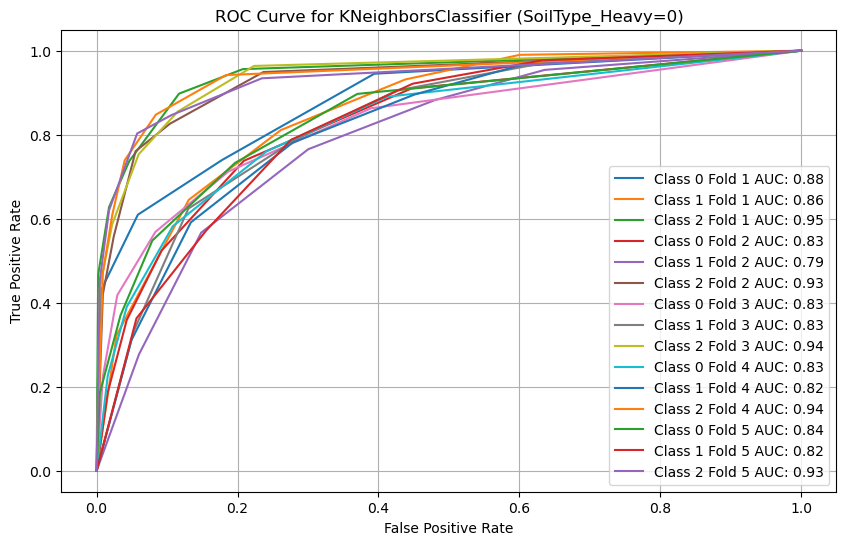

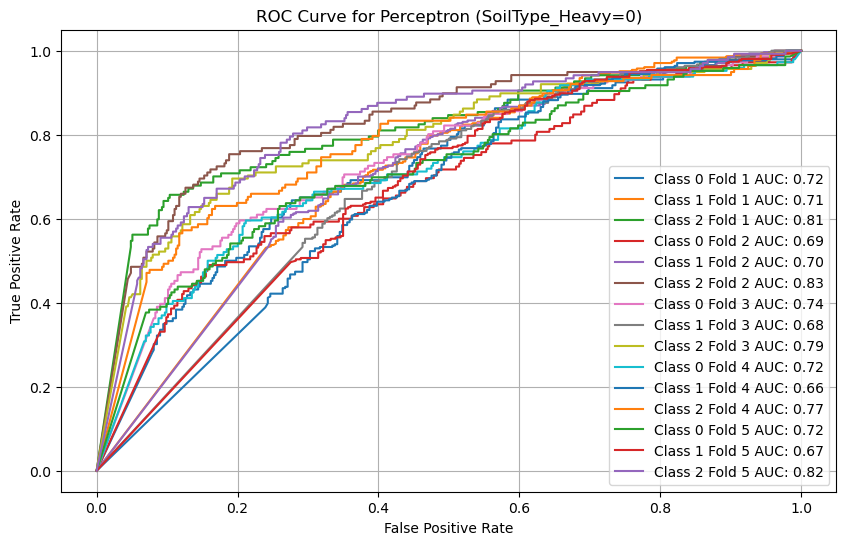

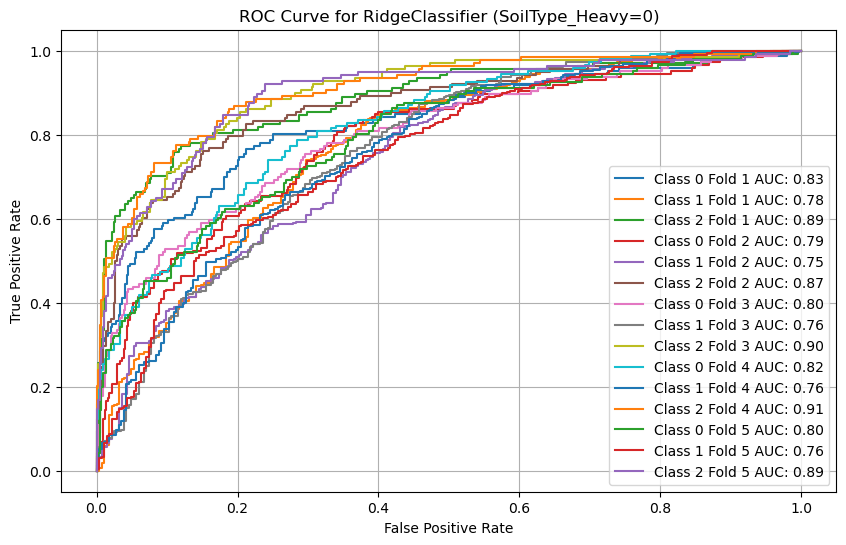


ROC Drawing for SoilType_Heavy = 1...


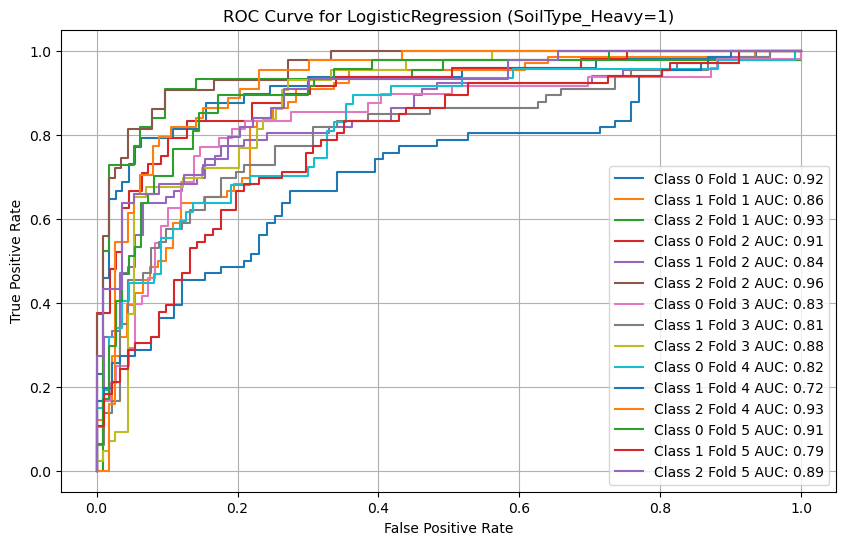

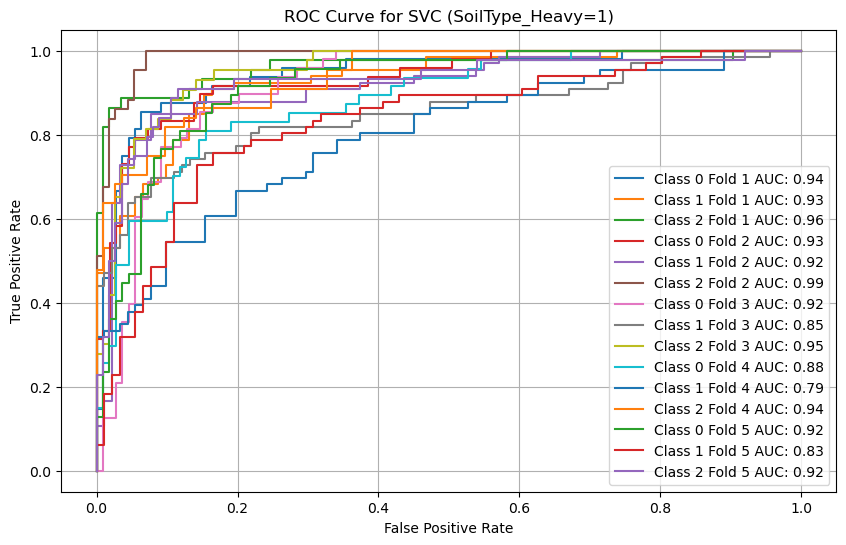

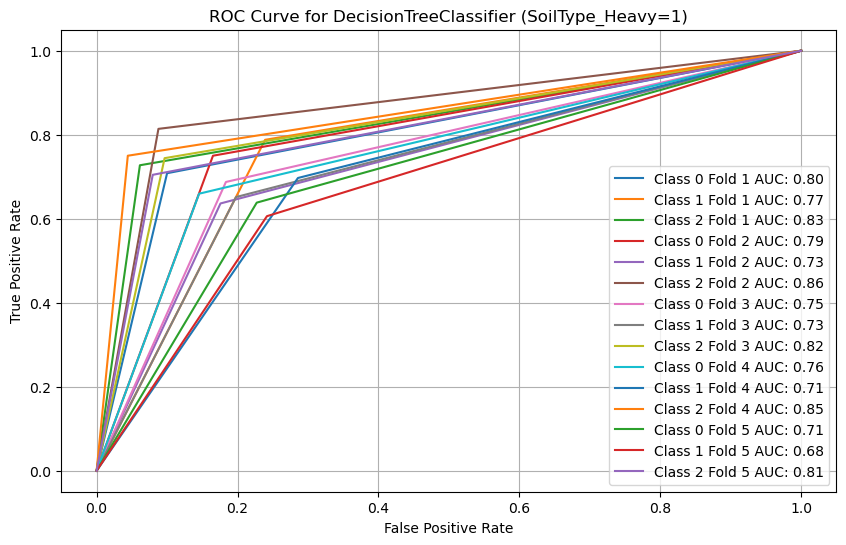

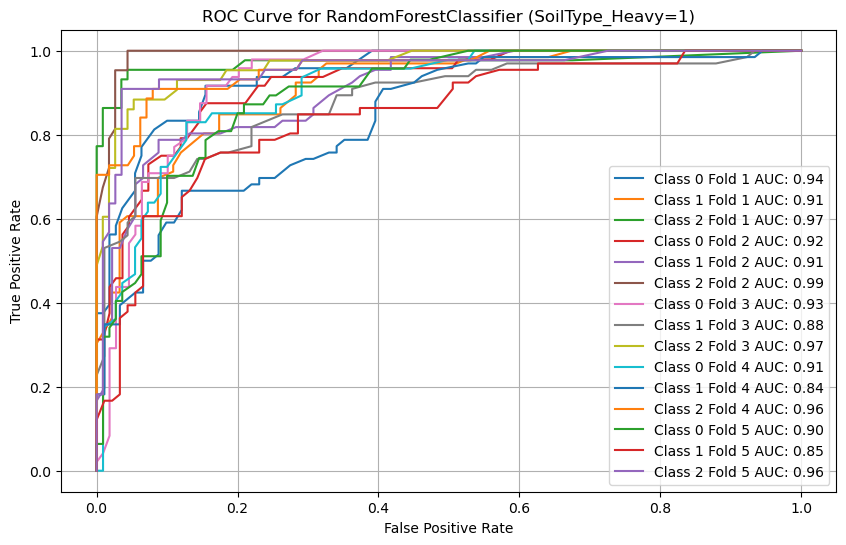

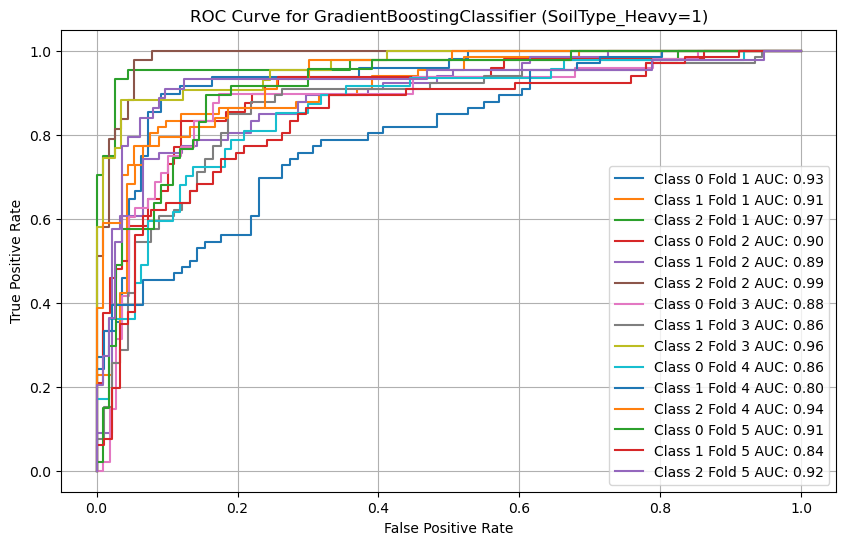

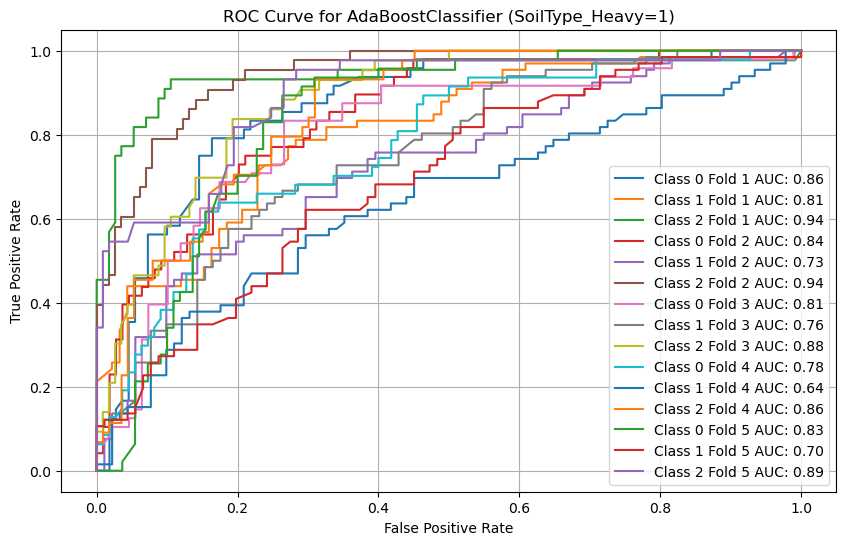

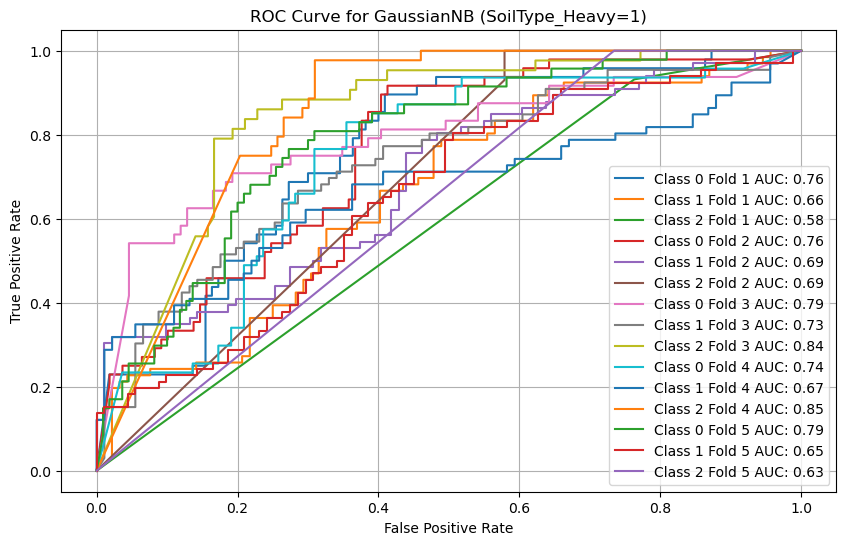

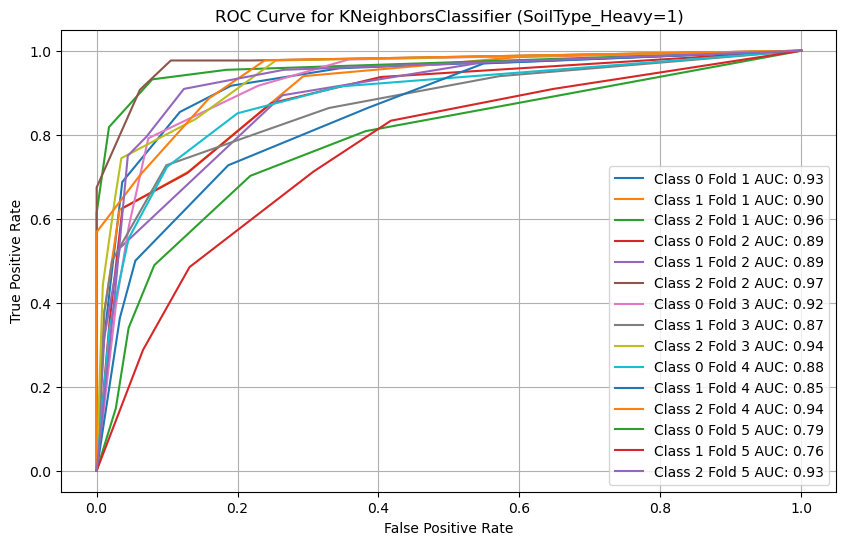

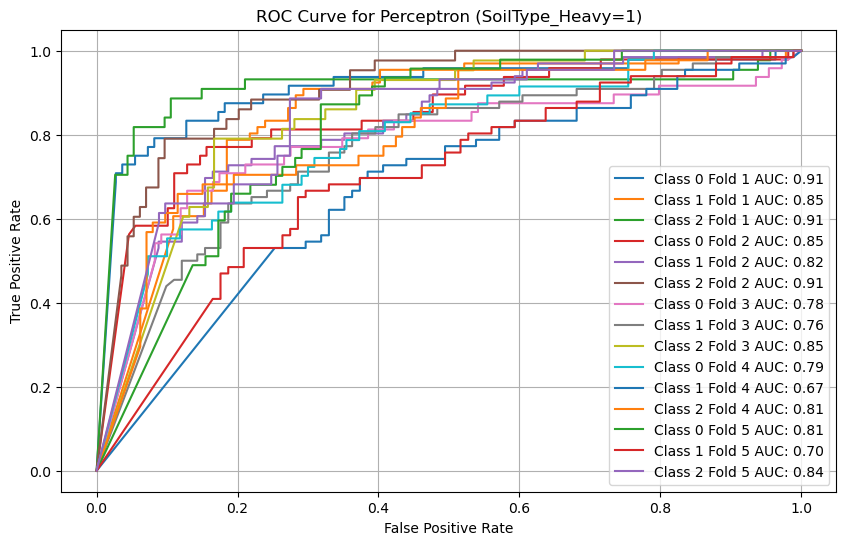

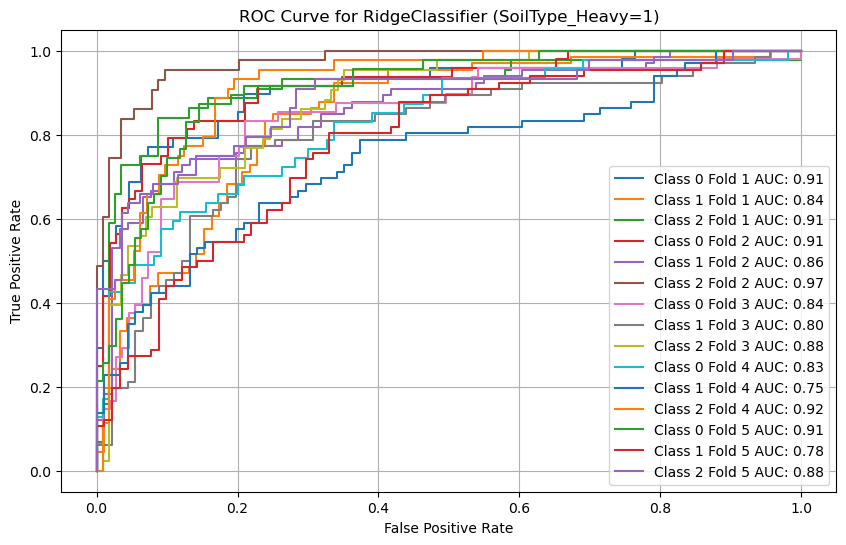


ROC Drawing for SoilType_Low = 0...


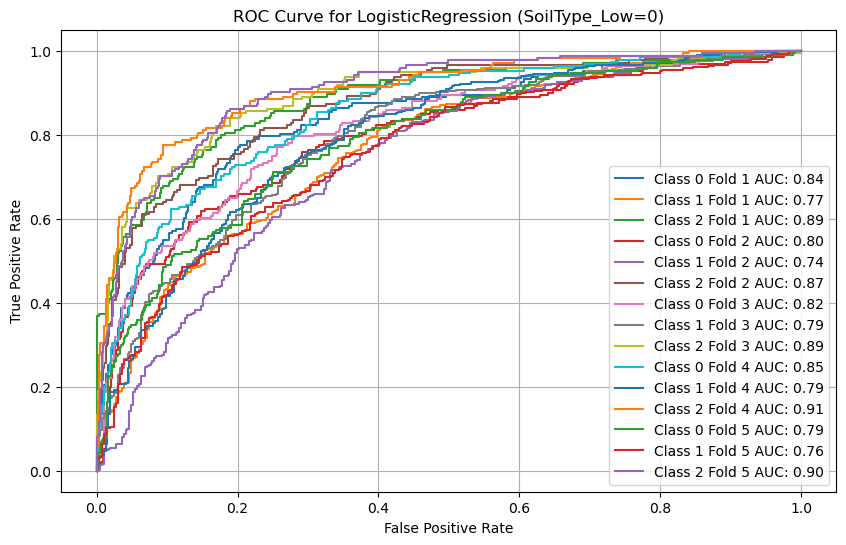

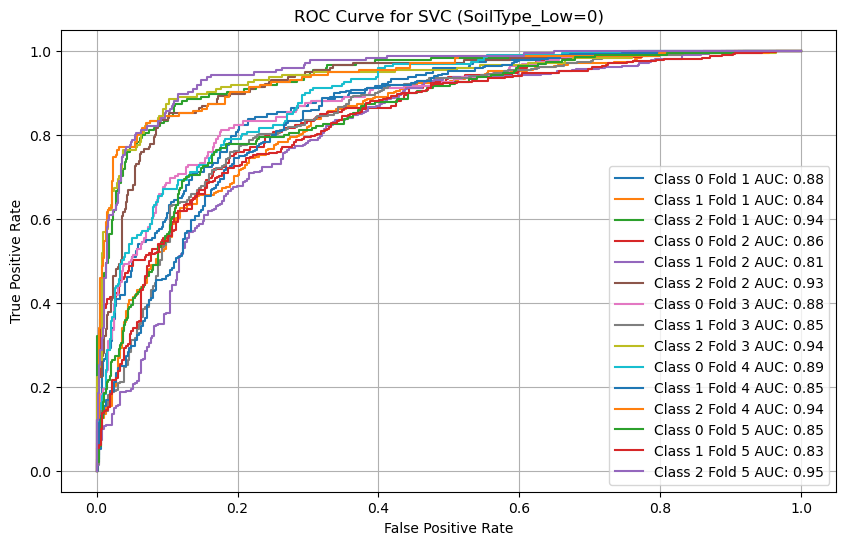

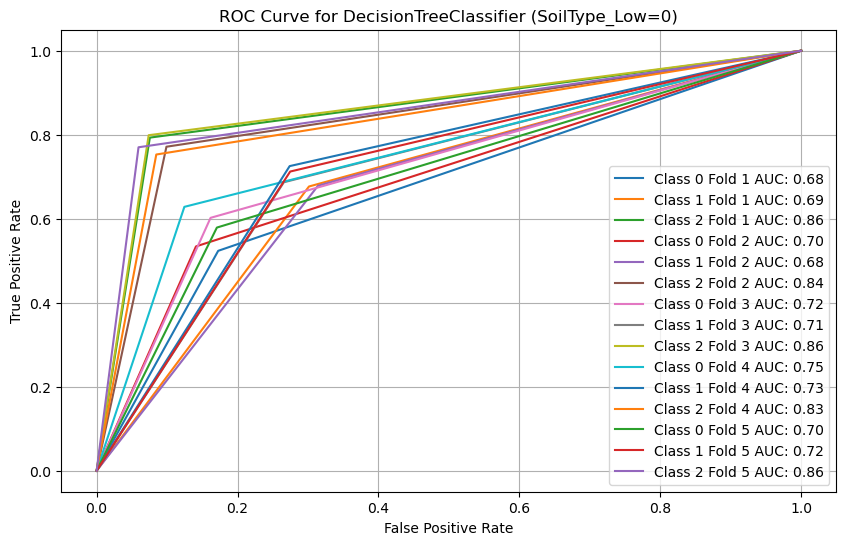

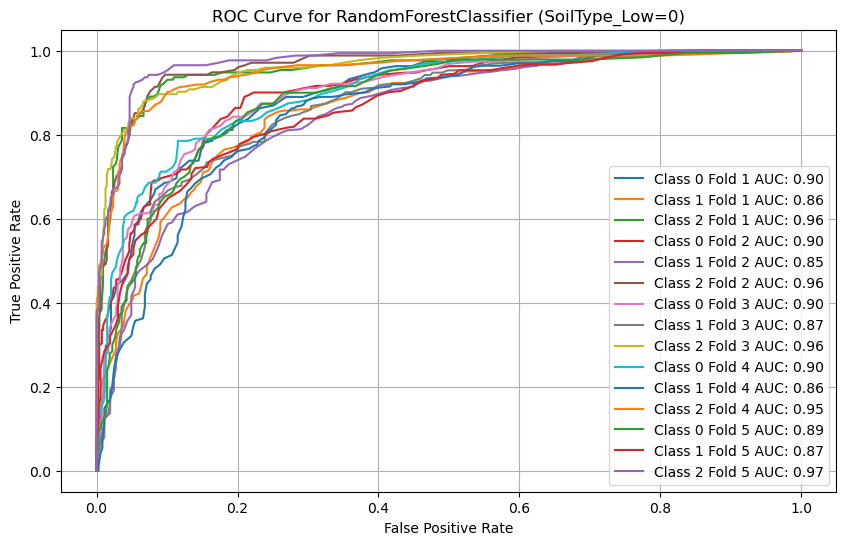

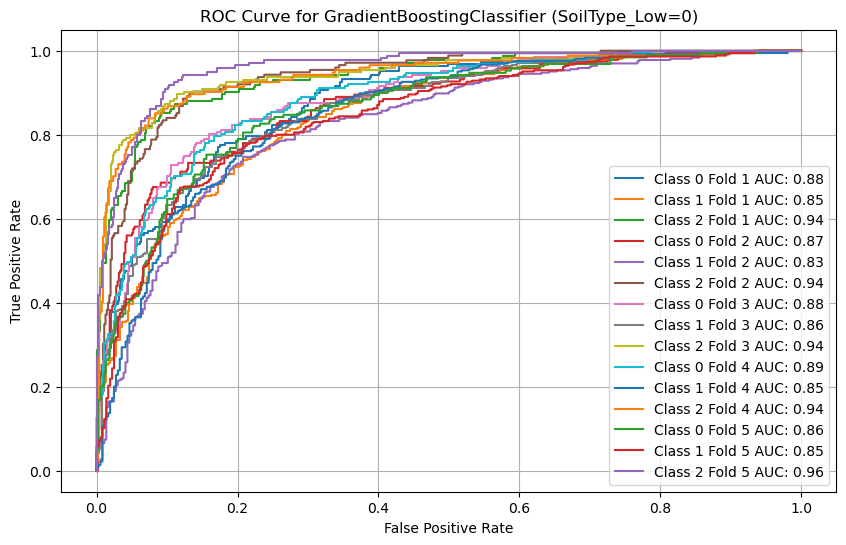

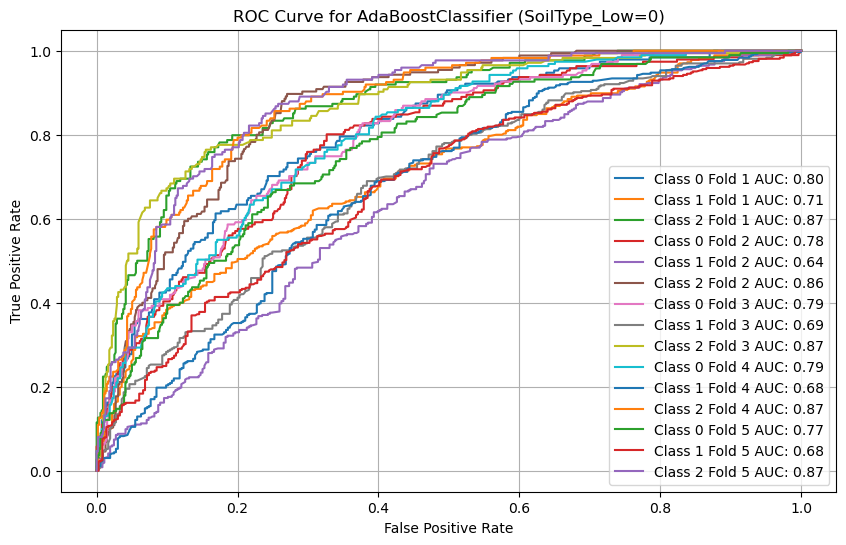

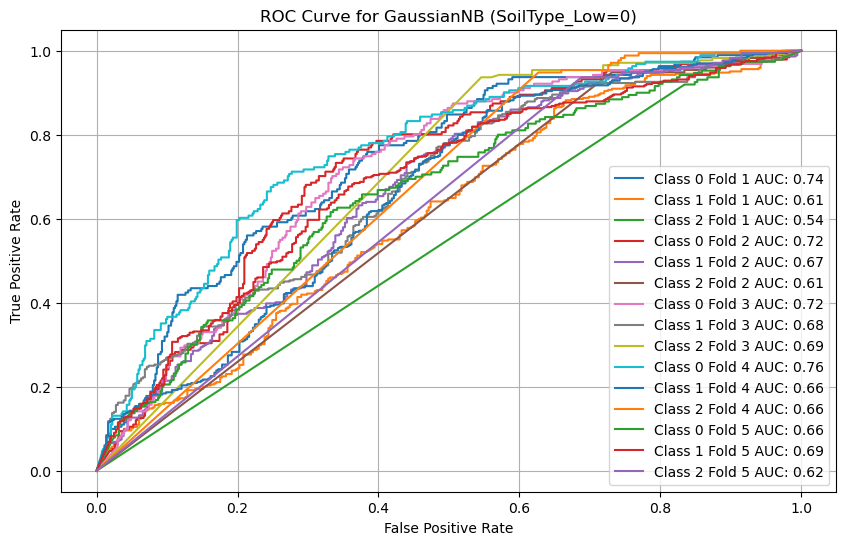

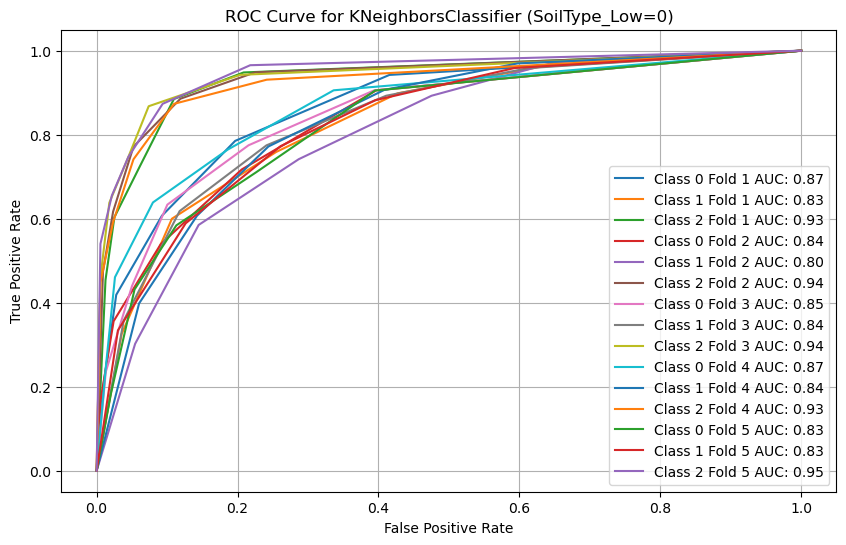

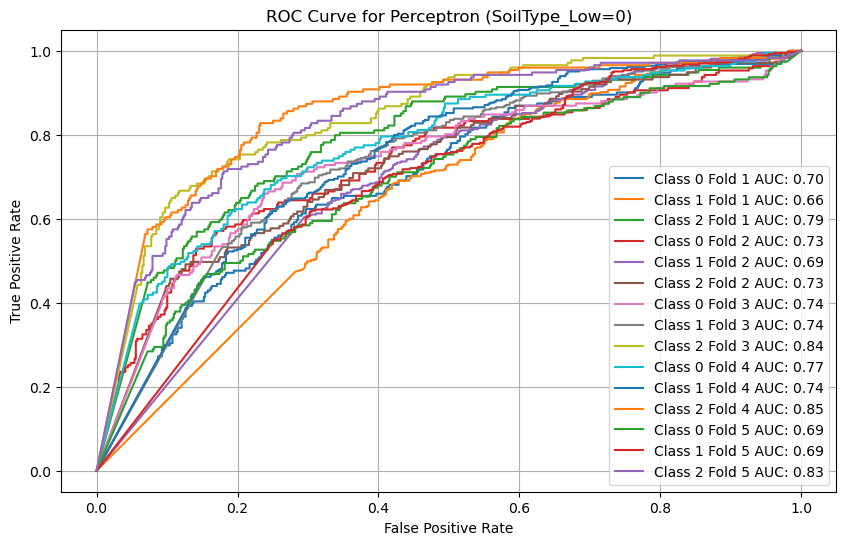

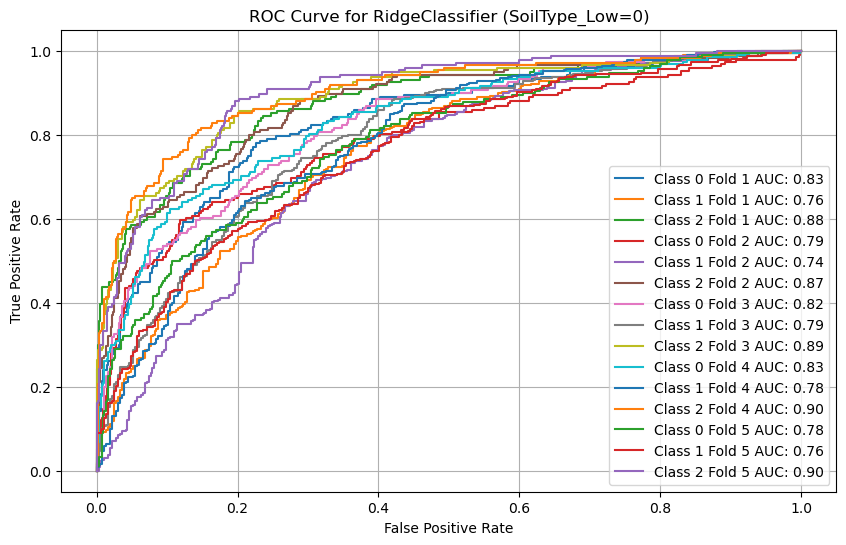


ROC Drawing for SoilType_Low = 1...


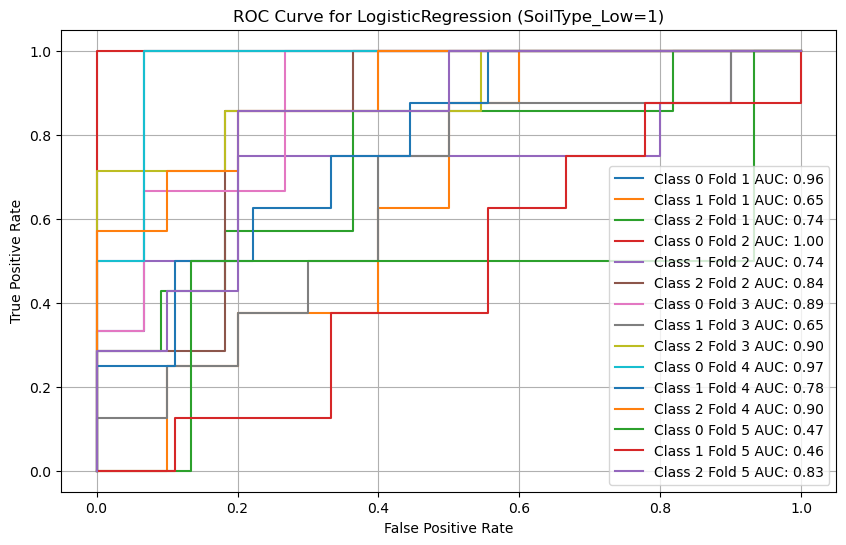

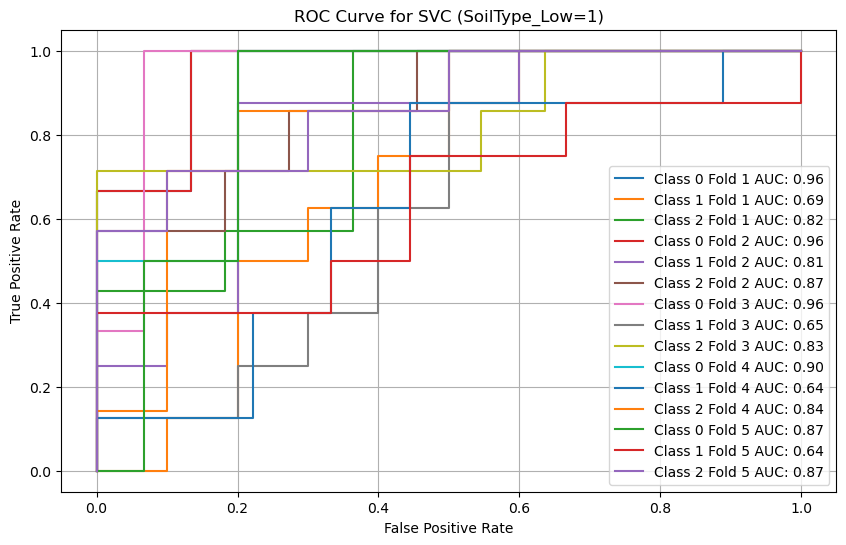

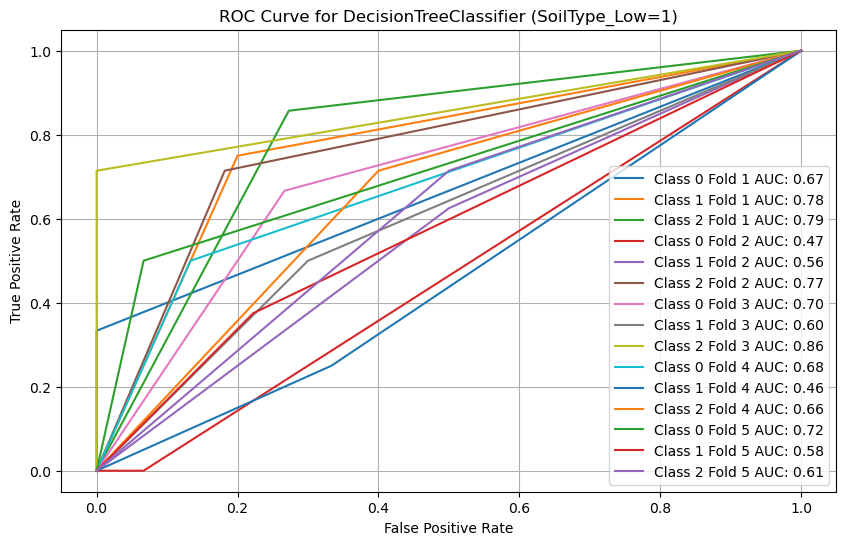

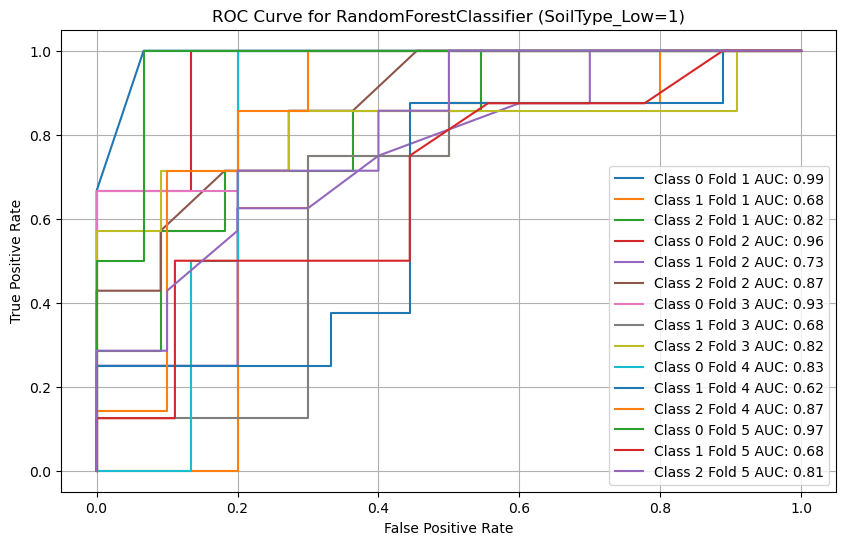

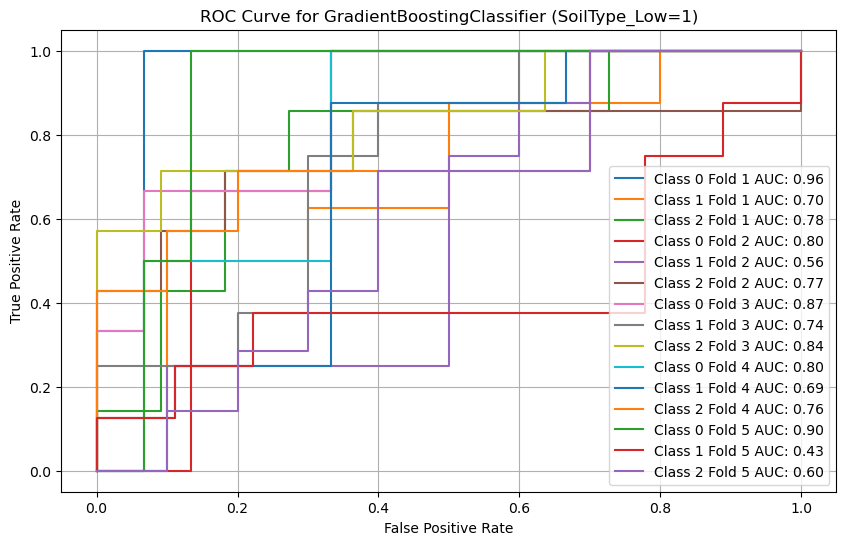

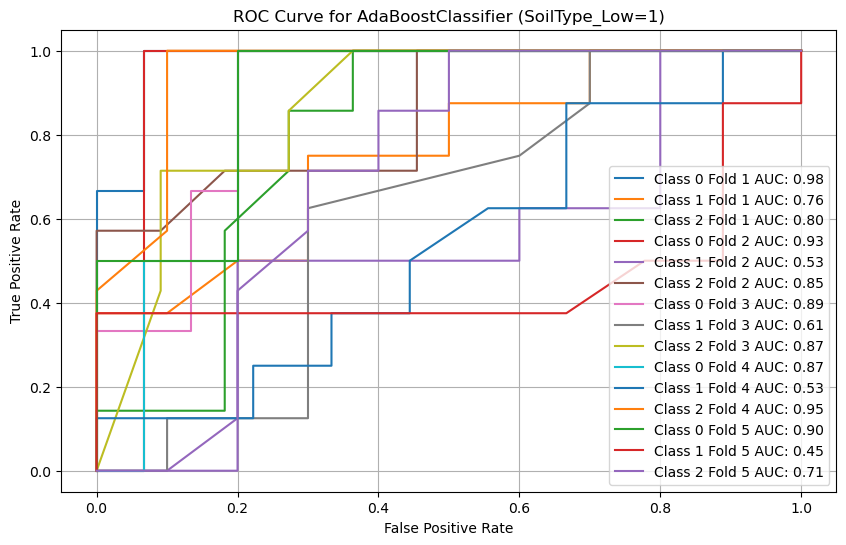

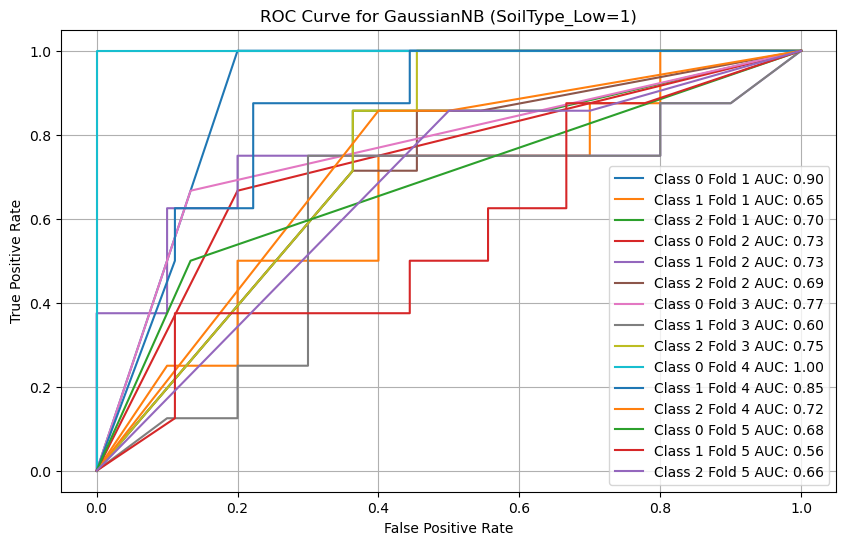

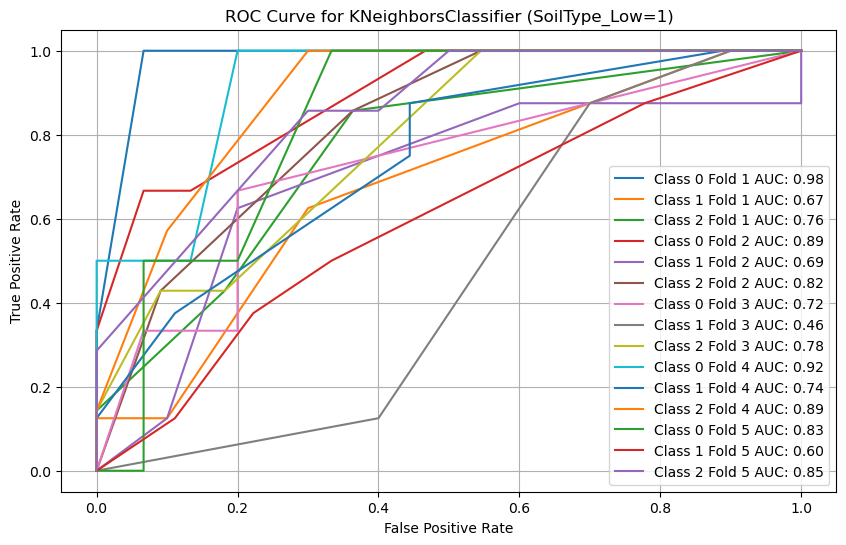

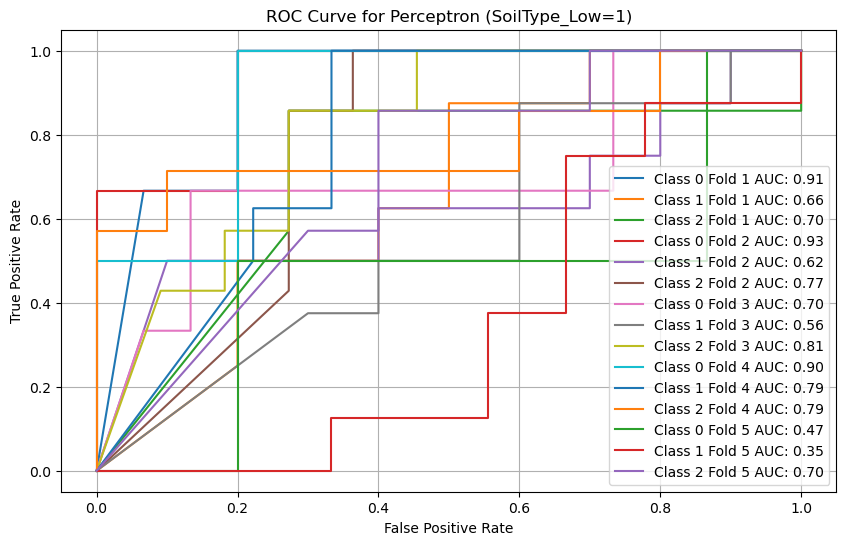

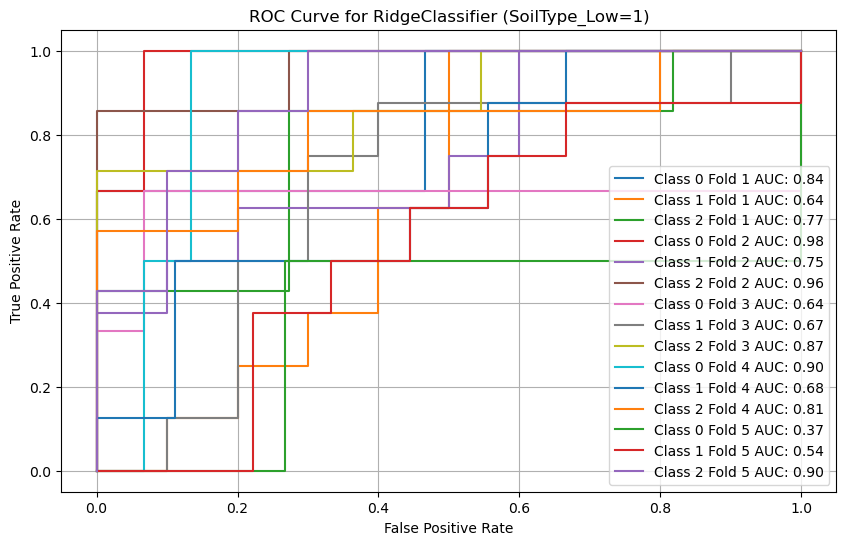


ROC Drawing for SoilType_Medium = 0...


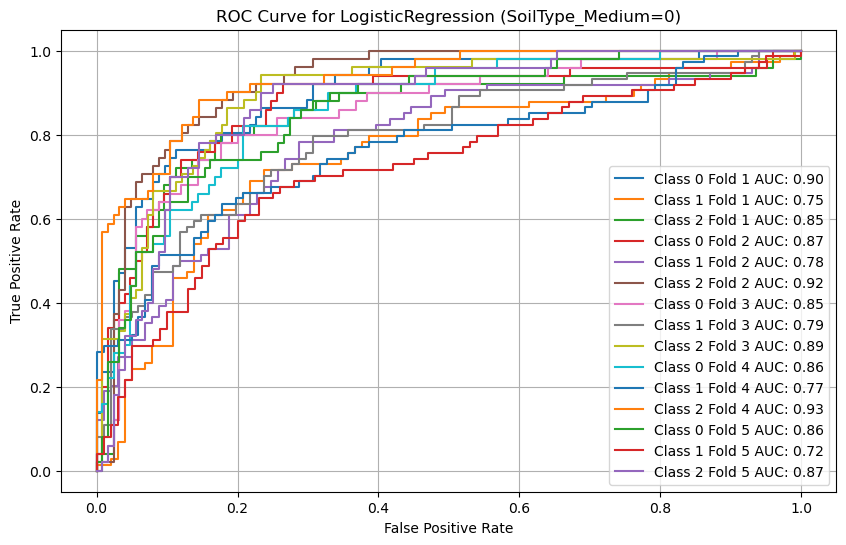

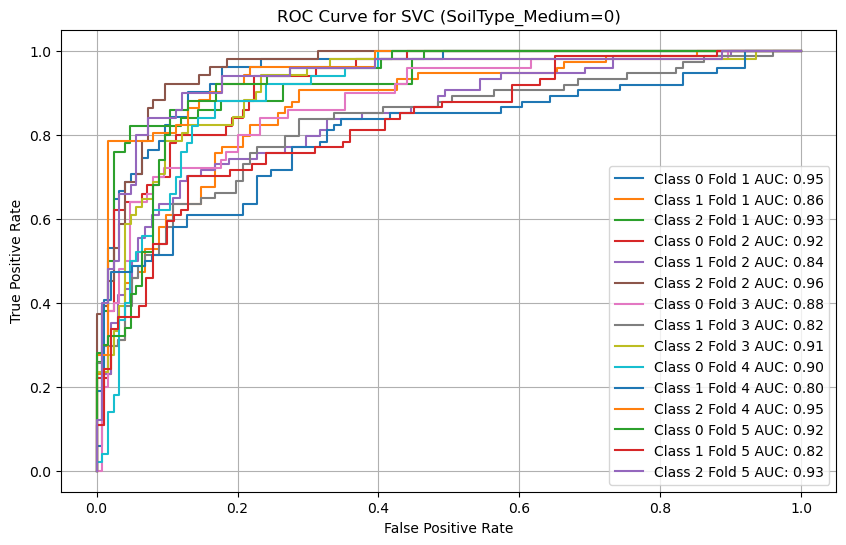

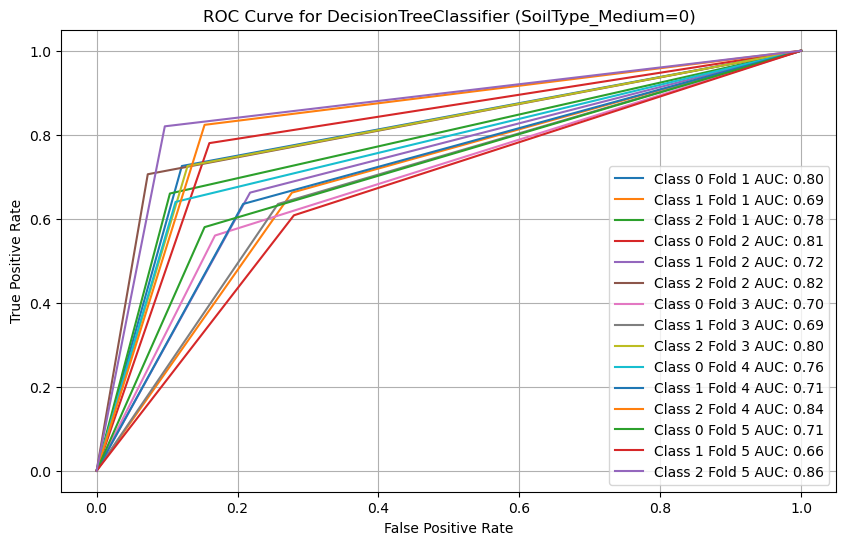

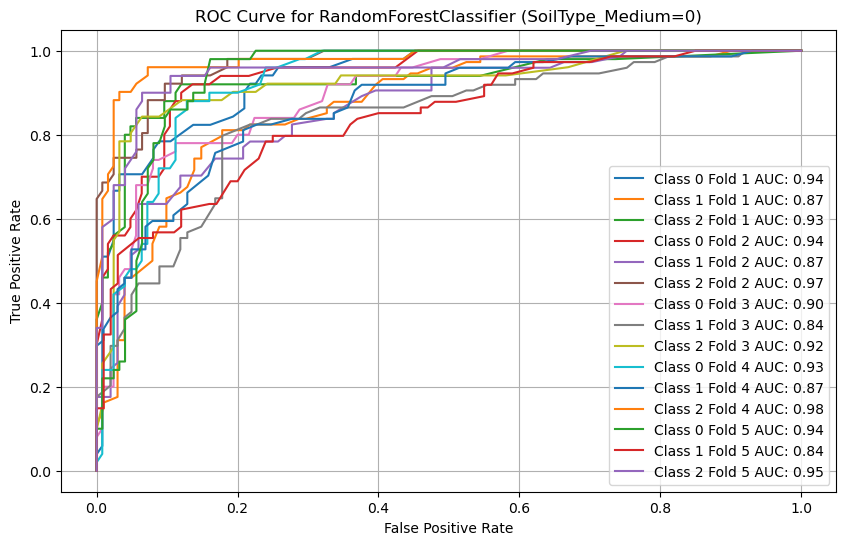

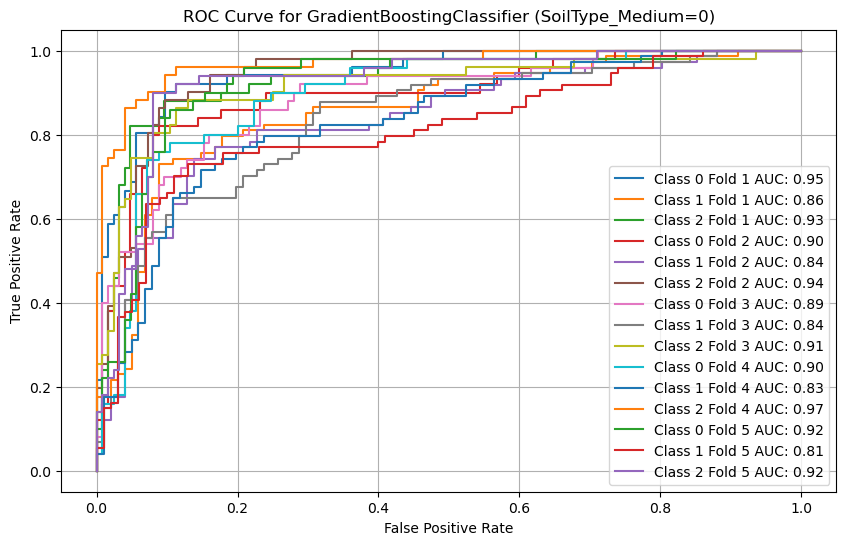

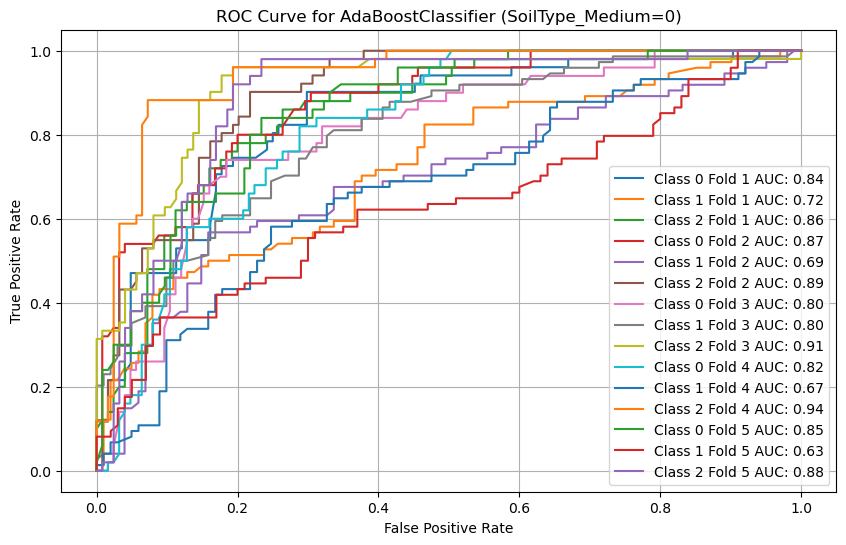

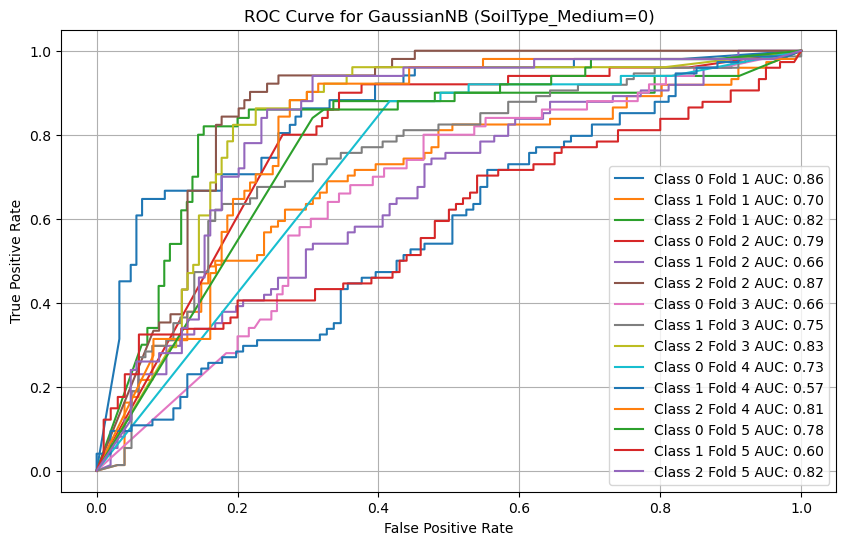

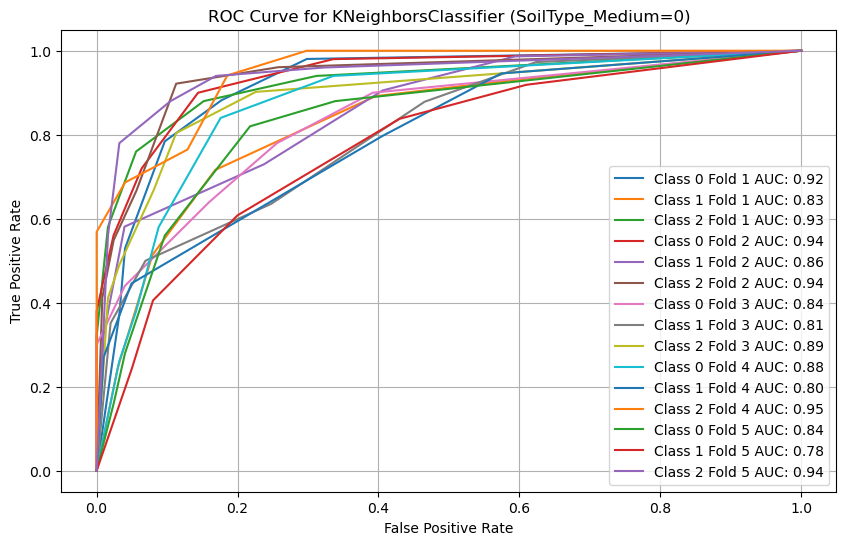

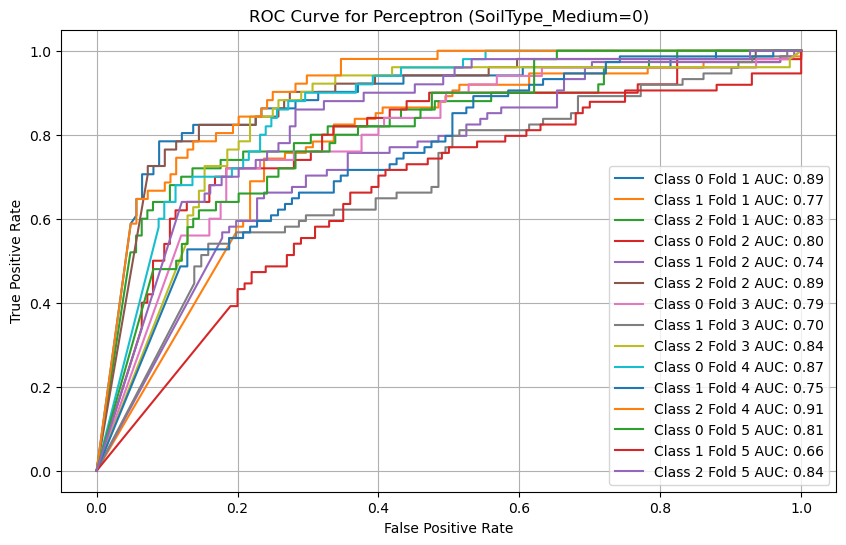

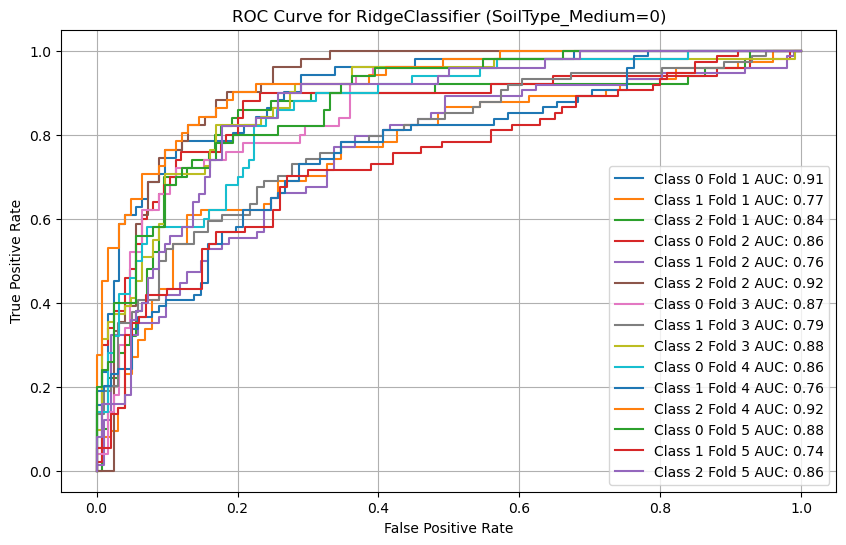


ROC Drawing for SoilType_Medium = 1...


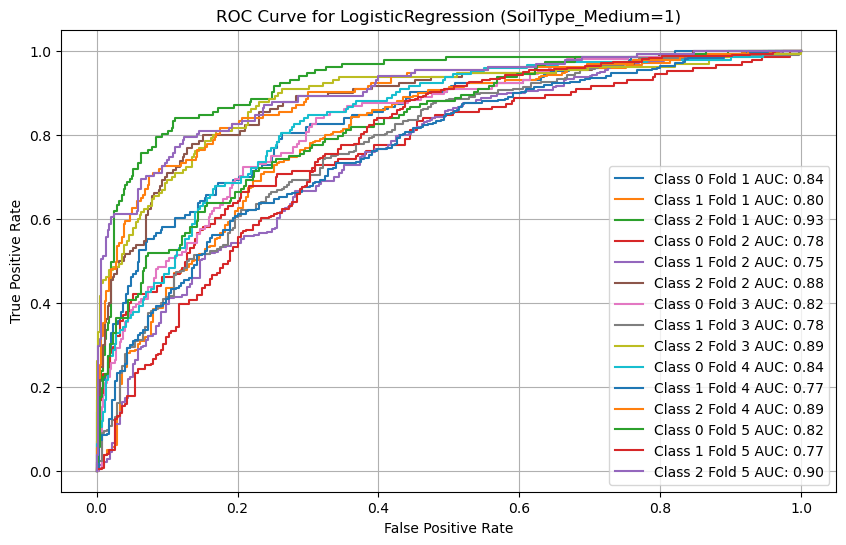

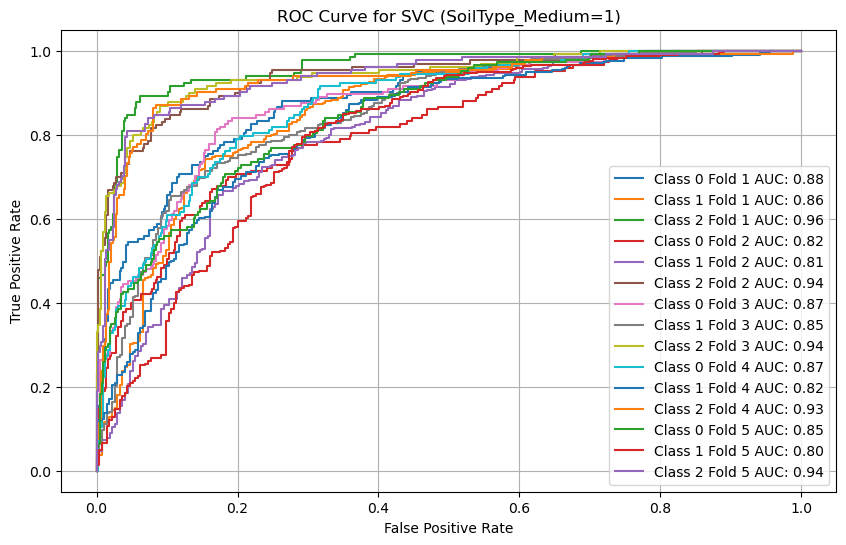

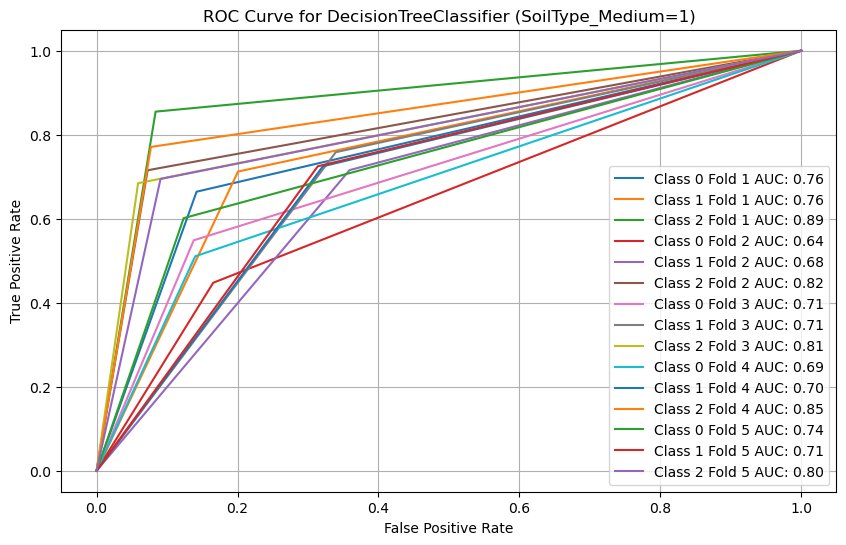

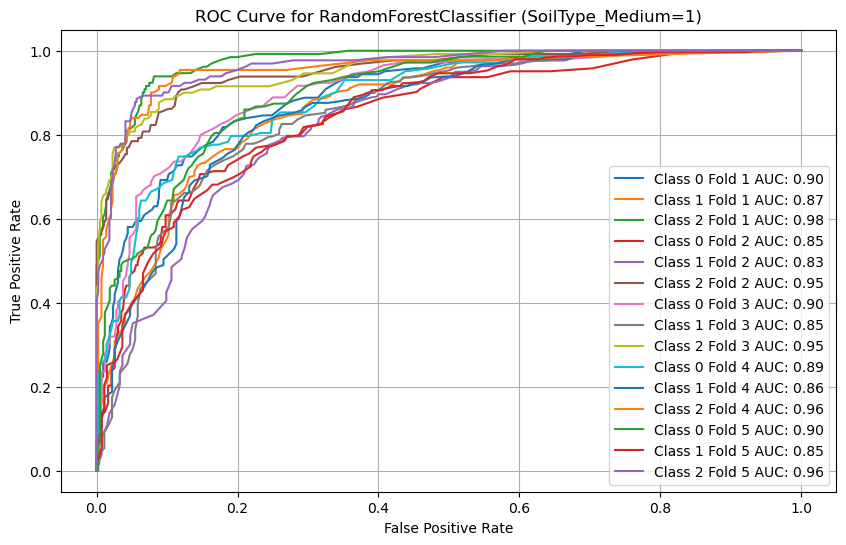

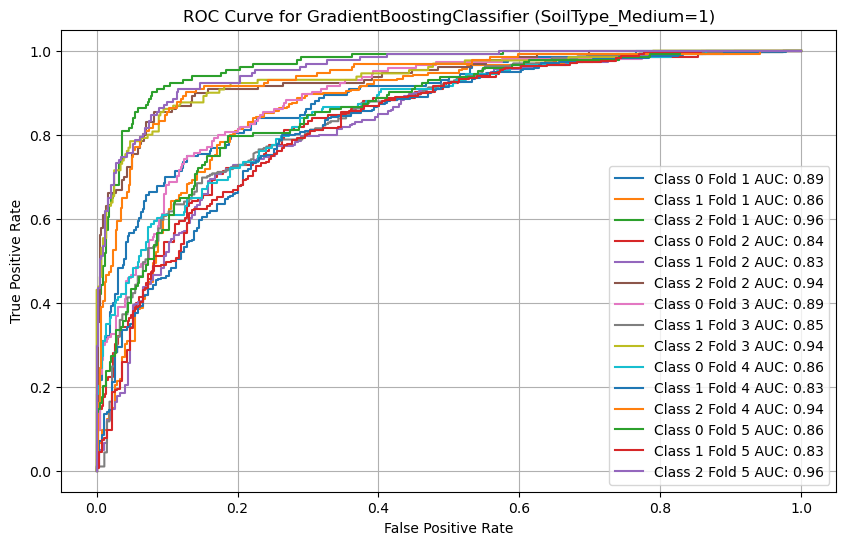

...

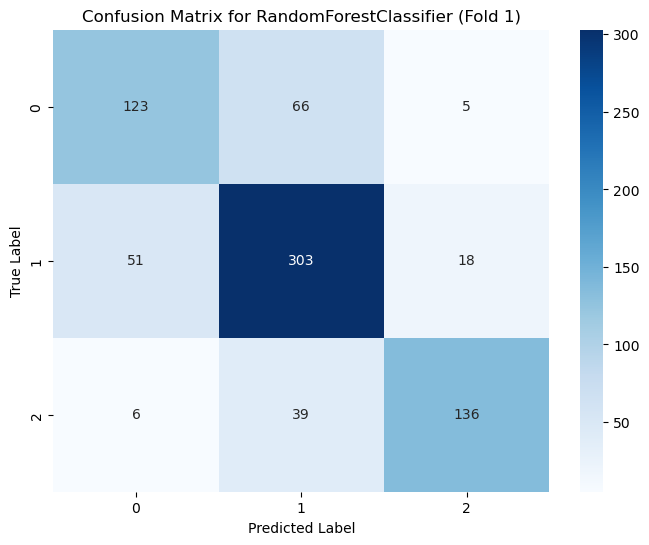

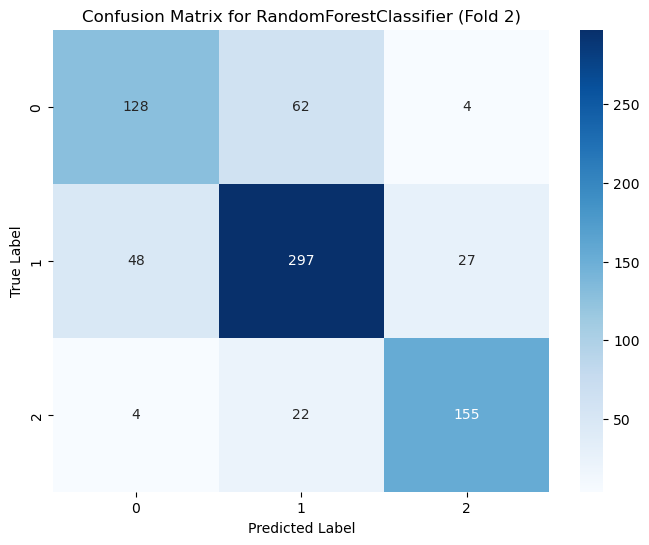

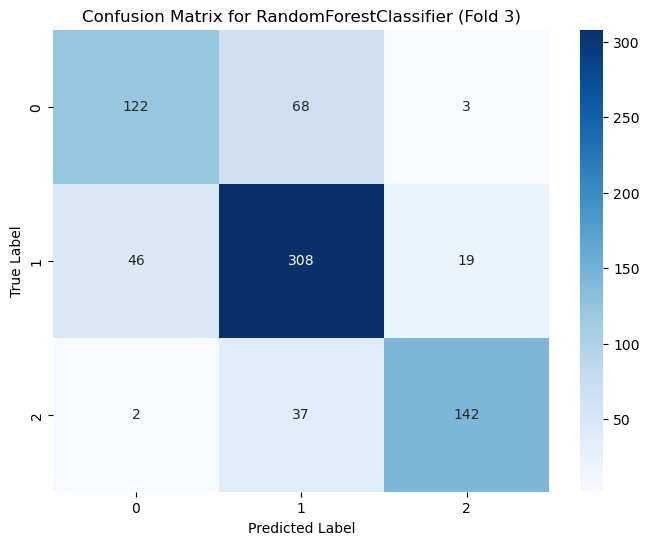

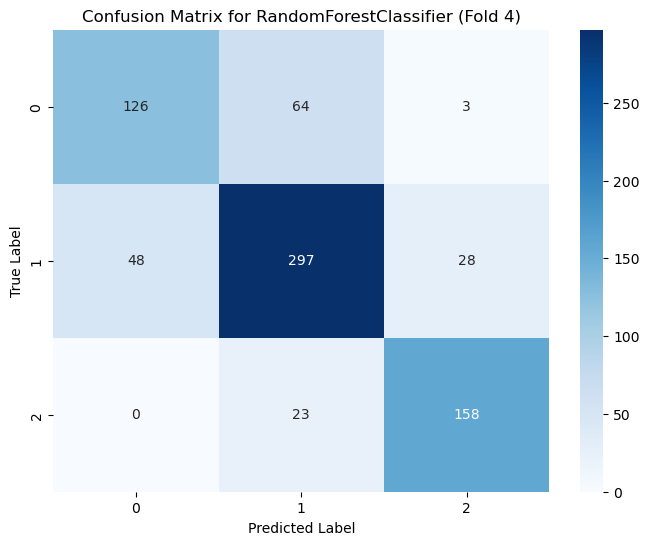

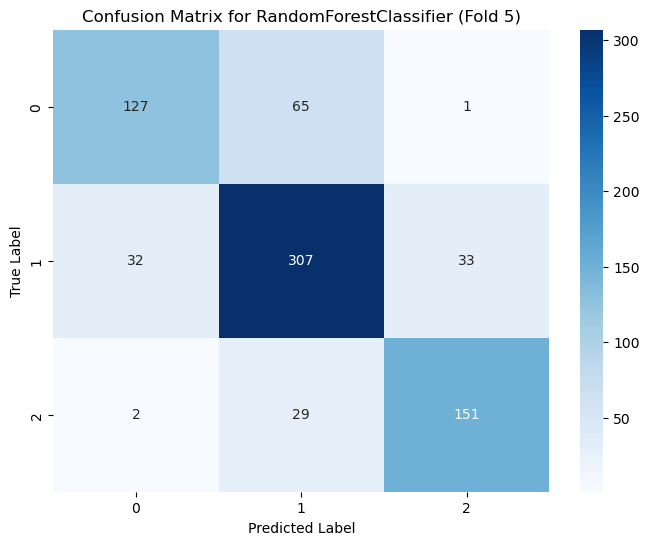

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, f1_score, precision_score, recall_score, matthews_corrcoef
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.linear_model import RidgeClassifier
from sklearn.metrics import confusion_matrix

# Set pandas display options
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)
pd.set_option('display.width', 1000)  # Yatayda daha fazla alan kullanmasını sağlar

# Read data
dFrame = pd.read_excel("Data_processed.xlsx")

# Function to clean the data (fill missing values)
def cleanData(dataFrame):
    for column in dataFrame.columns:
        if dataFrame[column].dtype in ['float64', 'int64']:
            # Fill missing numeric values with mean
            dataFrame[column] = dataFrame[column].fillna(dataFrame[column].mean()) 
        else:
            # Fill missing categorical values with mode (most frequent value)
            dataFrame[column] = dataFrame[column].fillna(dataFrame[column].mode()[0])  
    return dataFrame

# Function to convert categorical columns to numeric
def changeToNumeric(dataFrame):
    for col in dataFrame.columns:
        if dataFrame[col].dtype not in ['float64', 'int64']:
            # Convert categorical columns to numeric codes
            dataFrame[col] = dataFrame[col].astype('category').cat.codes
    return dataFrame

# Function to perform feature selection using RFE (Recursive Feature Elimination)
def featureSelection(model, X, y):
    # Create the RFE model and select the top 10 features
    rfe = RFE(model, n_features_to_select=10)
    X_rfe = rfe.fit_transform(X, y)
    selected_features = X.columns[rfe.support_]
    return X_rfe, selected_features

# Function to perform evaluation metrics calculation
def evaluateModel(model, X, y):
    # Stratified 5-fold cross-validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Metrics lists
    auc_scores = []
    accuracy_scores = []
    f1_scores = []
    precision_scores = []
    recall_scores = []
    mcc_scores = []
    
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]  # Use .iloc[] for row indexing
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]  # Use .iloc[] for row indexing
        
        # Feature Scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        # Train and Predict
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        
        # Handle Perceptron which doesn't have predict_proba
        if hasattr(model, 'predict_proba'):
            y_prob = model.predict_proba(X_test_scaled)  # for AUC
        elif hasattr(model, 'decision_function'):
            # Use decision_function for Perceptron as a proxy for probabilities
            y_prob = model.decision_function(X_test_scaled)
            # Convert to probabilities using a sigmoid function (for binary classification)
            if len(np.unique(y)) == 2:
                y_prob = 1 / (1 + np.exp(-y_prob))  # Sigmoid for binary classification
            else:
                # For multi-class classification, we can use the softmax function
                # but let's skip AUC calculation for Perceptron in multi-class case
                y_prob = None  # Set it to None, we will not calculate AUC for multi-class models with decision_function
        
        # Calculate metrics
        if y_prob is not None:  # Only calculate AUC if y_prob is available
            try:
                if len(np.unique(y)) > 2:  # Multi-class classification
                    auc_score = roc_auc_score(y_test, y_prob, multi_class='ovr', average='macro')  # Multi-class AUC
                else:  # Binary classification
                    auc_score = roc_auc_score(y_test, y_prob)
                auc_scores.append(auc_score)
            except ValueError:
                # If AUC calculation fails, append NaN (e.g., in case of empty predictions or other issues)
                auc_scores.append(np.nan)
        else:
            auc_scores.append(np.nan)  # If no probability estimate, append NaN
        
        # Calculate other metrics
        accuracy_scores.append(accuracy_score(y_test, y_pred))
        f1_scores.append(f1_score(y_test, y_pred, average='weighted'))
        precision_scores.append(precision_score(y_test, y_pred, average='weighted'))
        recall_scores.append(recall_score(y_test, y_pred, average='weighted'))
        mcc_scores.append(matthews_corrcoef(y_test, y_pred))
    
    # Store the results for this model
    results = {
        "Model": model.__class__.__name__,
        "AUC": np.nan if np.isnan(np.mean(auc_scores)) else np.mean(auc_scores),  # Handle NaN AUC
        "Accuracy (CA)": np.mean(accuracy_scores),
        "F1-score": np.mean(f1_scores),
        "Precision": np.mean(precision_scores),
        "Recall": np.mean(recall_scores),
        "MCC": np.mean(mcc_scores)
    }
    
    return results

# List of models to evaluate
models = [
    LogisticRegression(max_iter=10000, solver='liblinear', random_state=42),  # Increased max_iter and solver changed
    SVC(random_state=42, probability=True),  # SVC with probability=True for AUC
    DecisionTreeClassifier(random_state=42),
    RandomForestClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    AdaBoostClassifier(random_state=42, algorithm='SAMME'),
    GaussianNB(),
    KNeighborsClassifier(),
    Perceptron(random_state=42),
    RidgeClassifier(random_state=42),
]

# Clean the data
cleanedData = cleanData(dFrame)

# Convert non-numeric data to numeric
dFrame = changeToNumeric(cleanedData)

# Split data into features and target
X = dFrame.drop('GrainYield', axis=1)  # Assuming 'GrainYield' is the target column
y = dFrame['GrainYield']

# Initialize a list to store results
all_results = []

# Evaluate each model and store the results
for model in models:
    # Feature selection (RFE) for Logistic Regression (or any other model you choose)
    if model.__class__.__name__ == 'LogisticRegression':
        print(f"Evaluating model {model.__class__.__name__} with feature selection...")
        X_rfe, selected_features = featureSelection(model, X, y)
        print(f"Selected Features: {selected_features}")
        # Evaluate on selected features
        result_with_fs = evaluateModel(model, pd.DataFrame(X_rfe, columns=selected_features), y)
        all_results.append(result_with_fs)
    else:
        print(f"Evaluating model {model.__class__.__name__} without feature selection...")
        result = evaluateModel(model, X, y)
        all_results.append(result)

# Create a DataFrame to display results as a table
results_df = pd.DataFrame(all_results)

# Display the results
print("Model Evaluation Results:")
print(results_df)

# Sort by any column, by AUC
results_df = results_df.sort_values(by="AUC", ascending=False)
print("\nSorted by AUC:")
print(results_df)

# Kategorik Özellikler ile Karşılaştırma Fonksiyonu
def evaluate_by_categorical_attributes(X, y, categorical_columns, models):
    comparison_results = []
    
    # Kategorik özelliklerin kombinasyonları üzerinde dönüyoruz
    for cat_column in categorical_columns:
        # Categorical column'dan grup oluştur
        grouped_data = X.groupby(cat_column)
        
        for group_name, group_data in grouped_data:
            print(f"Evaluating for {cat_column}: {group_name}")
            
            
            X_group = group_data
            y_group = y[X_group.index]
            
            
            for model in models:
                print(f"Evaluating model {model.__class__.__name__} for {cat_column} = {group_name}...")
                
                result = evaluateModel(model, X_group, y_group)
                result['Categorical Attribute'] = cat_column
                result['Category Value'] = group_name
                comparison_results.append(result)
    
    # Sonuçları bir DataFrame'de topla
    comparison_df = pd.DataFrame(comparison_results)
    return comparison_df

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from scipy.special import softmax

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc
from scipy.special import softmax
import numpy as np
import matplotlib.pyplot as plt

def draw_all_rocs(comparison_results_df, X, y, categorical_columns, models):
    """
    Tüm modeller ve kategorik özellikler için ROC eğrilerini çizdirir.
    """
    for cat_column in categorical_columns:
        # Kategorik kolon için gruplama
        grouped_data = X.groupby(cat_column)

        for group_name, group_data in grouped_data:
            print(f"\nROC Drawing for {cat_column} = {group_name}...")

            X_group = group_data
            y_group = y[X_group.index]

            for model in models:
                model_name = model.__class__.__name__
                try:
                    # Stratified 5-fold split kullanarak ROC çizdirme
                    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

                    plt.figure(figsize=(10, 6))

                    for fold_idx, (train_idx, test_idx) in enumerate(skf.split(X_group, y_group), 1):
                        X_train, X_test = X_group.iloc[train_idx], X_group.iloc[test_idx]
                        y_train, y_test = y_group.iloc[train_idx], y_group.iloc[test_idx]

                        # Feature Scaling
                        scaler = StandardScaler()
                        X_train_scaled = scaler.fit_transform(X_train)
                        X_test_scaled = scaler.transform(X_test)

                        # Modeli eğit
                        model.fit(X_train_scaled, y_train)

                        # Tahminler
                        if hasattr(model, 'predict_proba'):
                            y_prob = model.predict_proba(X_test_scaled)
                        elif hasattr(model, 'decision_function'):
                            scores = model.decision_function(X_test_scaled)
                            y_prob = softmax(scores, axis=1)  # Çok sınıflı olasılığa dönüştür
                        else:
                            y_prob = None

                        # ROC Eğrisi
                        if y_prob is not None:
                            if len(np.unique(y_group)) > 2:  # Çok sınıflı
                                y_test_binarized = label_binarize(y_test, classes=np.unique(y_group))
                                for i in range(y_test_binarized.shape[1]):
                                    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
                                    roc_auc = auc(fpr, tpr)
                                    plt.plot(fpr, tpr, label=f'Class {i} Fold {fold_idx} AUC: {roc_auc:.2f}')
                            else:  # İkili sınıf
                                fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
                                roc_auc = auc(fpr, tpr)
                                plt.plot(fpr, tpr, label=f'Fold {fold_idx} AUC: {roc_auc:.2f}')

                    # ROC Grafiği Özellikleri
                    plt.title(f'ROC Curve for {model_name} ({cat_column}={group_name})')
                    plt.xlabel('False Positive Rate')
                    plt.ylabel('True Positive Rate')
                    plt.legend(loc='lower right')
                    plt.grid()
                    plt.show()

                except Exception as e:
                    print(f"ROC çizdirilemedi ({model_name} için {cat_column}={group_name}): {e}")


def plot_confusion_matrix(models, X, y):
    """
    Verilen modellerin her birinin, stratified k-fold cross-validation ile
    confusion matrix'lerini çizer.
    """
    # En iyi modeli AUC'ye göre seç
    best_model_name = results_df.sort_values(by="AUC", ascending=False).iloc[0]["Model"]
    best_model = [model for model in models if model.__class__.__name__ == best_model_name][0]
    
    # Stratified 5-fold cross-validation kullanarak modelin her fold için confusion matrix'ini çiziyoruz
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for fold_idx, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Feature Scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Modeli eğit ve tahmin et
        best_model.fit(X_train_scaled, y_train)
        y_pred = best_model.predict(X_test_scaled)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)

        # Confusion Matrix'i görselleştirme
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y), yticklabels=np.unique(y))
        plt.title(f"Confusion Matrix for {best_model_name} (Fold {fold_idx})")
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()
        
# Kategorik özelliklere göre model değerlendirmesi yap
categorical_columns = ['State_UP', 'State_Bihar', 'SoilType_Heavy', 'SoilType_Low', 'SoilType_Medium']
comparison_results_df = evaluate_by_categorical_attributes(X, y, categorical_columns, models)

# Sonuçları görüntüle
print("Model Evaluation Results by Categorical Attributes:")
print(comparison_results_df)

# AUC'ye göre sıralama
comparison_results_df_sorted = comparison_results_df.sort_values(by="AUC", ascending=False)
print("\nSorted by AUC for Categorical Comparison:")
print(comparison_results_df_sorted)

draw_all_rocs(comparison_results_df, X, y, categorical_columns, models)

# Confusion Matrix çizme fonksiyonunu çağırma
plot_confusion_matrix(models, X, y)


